## Итоговый проект первого года обучения
### <center> **Определение уязвимых групп населения**</center>

В распоряжении есть данные о доходах, заболеваемости, социально незащищённых слоях населения России и другие экономические и демографические данные.

Согласно опросу «инФОМ» от декабря 2021 года, у 27 % россиян хватает денег только на еду, а ещё 9 % не могут позволить себе полноценное питание. Эти люди особенно внимательно следят за ценами, а темп роста цен на продукты обычно превышает средний темп инфляции. При этом Росстат считает, что расходы на продукты питания должны составлять примерно 36 % от среднемесячных расходов россиянина (ещё около 10 % приходится на услуги ЖКХ и жильё, 4 % — на лекарства).

До 2021 года «черта бедности» (жизнь на сумму ниже прожиточного минимума) в России определялась стоимостью минимальной продуктовой корзины. В том же году правительство «отвязало» уровень бедности от цен на базовые продукты: с 2021 года прожиточный минимум рассчитывается как 44.2 % от медианного дохода граждан РФ за прошлый год.

**Задача:**
* кластеризовать регионы России и определить, какие из них наиболее остро нуждаются в помощи малообеспеченным/неблагополучным слоям населения;
* описать группы населения, сталкивающиеся с бедностью;
* определить:

    * влияет ли число детей, пенсионеров и других социально уязвимых групп на уровень бедности в регионе;
    * связаны ли уровень бедности/социального неблагополучия с производством и потреблением в регионе;
    * какие ещё зависимости можно наблюдать относительно социально незащищённых слоёв населения.


In [1]:
import pandas as pd
import numpy as np
from sklearn import linear_model
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

import warnings 
warnings.filterwarnings("ignore")


### 1. Знакомство с данными

Загрузка всех необходимых таблиц, разведывательный анализ данных.

Функция для опеределения региона: Федерация, Федеральный округ и т.д.

* уровень 0 - Российская Федерация;
* уровень 1 - федеральный округ;
* уровень 2 - интересующие нас регионы;
* уровень 3 - автономии в составе области.


In [2]:
def region_level(x):
    if x.find('Федерация') > -1:
        return 0
    elif x.find('федеральный округ') > -1:
        return 1
    elif x.find('область)') > -1:
        return 3
    elif x.find('область (') > -1:
        return 3
    elif x.find('область без') > -1:
        return 3
    elif x.find('в том числе') > -1:
        return 1
    else:
        return 2

Регионы имеют разные названия. Верным будем считать наименование из таблицы **population.xlsx**

In [3]:
def region_rename(x):
    if x.find('Москва') > - 1 and x.find('старых') == -1:
        return 'Город Москва столица Российской Федерации город федерального значения'
    elif x.find('Санкт-Петербург') > - 1 or x.find('Санкт - Петербург') > - 1:
        return 'Город Санкт-Петербург город федерального значения'
    elif x.find('Севастополь') > - 1:
        return 'Город федерального значения Севастополь'
    elif x.find('Ямало-Ненецкий') > -1 or x.find('Ямало-Ненецкий') > -1 or x.find('Ямало-Hенецкий') > -1:
        return 'Ямало-Ненецкий автономный округ (Тюменская область)'
    elif x.find('Архангельская') > - 1 and (x.find('(') == -1 or x.find('(без АО)') > -1):
        return 'Архангельская область (кроме Ненецкого автономного округа)'
    elif (x.find('Ненецкий автономный округ') > -1) or (x.find('Ненецкий авт. округ') > -1):
        return 'Ненецкий автономный округ (Архангельская область)'
    elif x.find('Республика Адыгея') > -1:
        return 'Республика Адыгея (Адыгея)'
    elif x.find('Республика Татарстан') > -1:
        return 'Республика Татарстан (Татарстан)'
    elif x.find('Чувашская Республика') > -1:
        return 'Чувашская Республика - Чувашия'
    elif (x.find('Тюменская область') > -1 and (x.find('(') == -1 or x.find('(без АО)') > -1)) or x.find('Тюменская обл.без') > -1:
        return 'Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)'
    elif x.find('Ханты-Мансийский') > -1:
        return 'Ханты-Мансийский автономный округ - Югра (Тюменская область)'
    elif x.find('Кемеровская область') > -1:
        return 'Кемеровская область - Кузбасс'
    elif x.find('Bладимирская область') > -1:
        return 'Владимирская область'
    elif x.find('Bоронежская область') > -1:
        return 'Воронежская область'
    elif x.find('Bологодская область') > -1:
        return 'Вологодская область'
    elif x.find('Bолгоградская область') > -1:
        return 'Волгоградская область'
    elif x.find('Республика Северная Осетия - Алания') > -1:
        return 'Республика Северная Осетия-Алания'
    elif x.find('Республика Саха(Якутия)') > -1:
        return 'Республика Саха (Якутия)'
    elif x.find('Еврейская авт. область') > -1:
        return 'Еврейская автономная область'
    elif x.find('Чукотский авт. округ') > -1:
        return 'Чукотский автономный округ'
    else:
        return x

Таблица **population.xlsx** содержит данные о численности постоянного населения на 1 января.

Данные начинаются со второй строки, ничего полезного в третьей строке не содержится, первые два поля не имеют заголовков, переименуем столбцы, явно укажем тип поля для ОКАТО (второй столбец).

In [4]:
population_df = pd.read_excel("data/population.xlsx", skiprows=[0, 2], dtype = {'Unnamed: 1': str})
population_df.rename(columns = {'Unnamed: 0':'region', 'Unnamed: 1':'okato'}, inplace=True)
display(population_df.head())

,region,okato,январь 1999 г.,январь 2000 г.,январь 2001 г.,январь 2002 г.,январь 2003 г.,январь 2004 г.,январь 2005 г.,январь 2006 г.,...,январь 2013 г.,январь 2014 г.,январь 2015 г.,январь 2016 г.,январь 2017 г.,январь 2018 г.,январь 2019 г.,январь 2020 г.,январь 2021 г.,январь 2022 г.
0,Российская Федерация,643,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Раздел 1. Муниципальные образования субъектов ...,00000000000,147539426.0,146890128.0,146303611.0,145649334.0,144963650.0,144333586.0,143801046.0,143236582.0,...,143347059.0,143666931.0,146267288.0,146544710.0,146804372.0,146880432.0,146780720.0,146748590.0,146171015.0,145557576.0
2,Центральный федеральный округ,030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Раздел 1. Муниципальные образования субъектов ...,00000000000,38311159.0,38227656.0,38175094.0,38068452.0,37946810.0,37965073.0,38044068.0,38109006.0,...,38678913.0,38819874.0,38951479.0,39104319.0,39209582.0,39311413.0,39378059.0,39433556.0,39250960.0,39104400.0
4,Белгородская область,14000000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


В данной таблице одна строка содержит наименование региона, а следующая за ней - необходимые данные. Создадим таблицу, в которой данные будут располагаться в одной строке с наименованием региона; переименуем стобцы (оставим в заголовке год на единицу меньше, чем в текущем заголовке). Также внесём в новую таблицу только регионы без РФ и федеральных округов. Учтём при этом особенности Архангельской и Тюменской областей (без входящих в них автономий и данные по самим автономиям).

In [5]:
population_clear_df = pd.DataFrame(columns=['region', 'okato'])

for index, row in population_df.iterrows():
    if len(row['okato']) == 11 and row['okato'] not in (['00000000000', '11000000000', '71000000000']):
        dict ={'region':row['region'],'okato':row['okato']}
        current_okato = row['okato']
    elif row['region'].find('Раздел 1') > -1 and not (current_okato is None):
        for i in range(1999, 2023):
            dict[str(i-1)] = row['январь {} г.'.format(i)]
        population_clear_df = pd.concat([population_clear_df, pd.DataFrame([dict])], ignore_index=True)
    else:
        current_okato = None
        dict = {}


#заменим все нули на пустые значения
population_clear_df = population_clear_df.replace({'0': np.nan, 0: np.nan})
display(population_clear_df.isnull().sum())

#отсутствуют данные на 1 января 2021 г.
display(population_clear_df[population_clear_df['2020'].isnull()][['region', 'okato']])

#эти шесть округов на сегодня не существуют, удалим; до 2014 г. нет данных по Республике Крым и Севастополю - их оставим.
population_clear_df.dropna(subset='2020', inplace=True)

display(population_clear_df.isnull().sum())


region     0
okato      0
1998       4
1999       4
2000       4
2001       4
2002      10
2003       8
2004       8
2005       8
2006       8
2007       8
2008       8
2009       8
2010       8
2011       8
2012       8
2013       8
2014       6
2015       6
2016       6
2017       6
2018       6
2019       6
2020       6
2021       6
dtype: int64

,region,okato
51,"Коми-Пермяцкий округ, входящий в состав Пермск...",57100000000
69,Агинский Бурятский округ (Забайкальский край),76100000000
71,Таймырский (Долгано-Ненецкий) автономный округ...,04100000000
72,Эвенкийский автономный округ (Красноярский край),04130000000
75,Усть-Ордынский Бурятский округ,25100000000
83,"Корякский округ, входящий в состав Камчатского...",30100000000


region    0
okato     0
1998      4
1999      4
2000      4
2001      4
2002      4
2003      2
2004      2
2005      2
2006      2
2007      2
2008      2
2009      2
2010      2
2011      2
2012      2
2013      2
2014      0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2021      0
dtype: int64

В таблице остались пустыми только данные до 2014 года, поэтому эти данные мы не рассматриваем.
Можно сделать вывод о том, что отсутствуют данные о численности населения по признаку "город/сельская местность", о численности населения по возрастным группам. Следовательно, наличие в некоторых таблицах разбивки по данным признакам можно игнорировать, объединяя данные в одну строку.

Каждую таблицу приведём к необходимому виду.

In [6]:
def processing_data(current_df, population_df): # current_df - обрабатываемая таблица, population_df - подготовленная 
    # на предыдущем шаге population_clear_df
    processing_df = current_df.copy()
    
    #присвоим каждому региону свой уровень. 0 и 1 - это Российская Федерация и округ, 
    # 3 - автономные образование, входящее в регион, 2 - республика, край, область
    processing_df['level'] = processing_df['region'].apply(region_level)
    processing_df = processing_df[processing_df['level'] > 1].copy() #нас не интересуют сводные данные, поэтому оставим только уровни 2 и 3
    processing_df['region'] = processing_df['region'].apply(lambda x: x.lstrip())
   
    #Архангельскую и Тюменскую области придется рассматривать отдельно, т.к. в их составе есть АО, 
    # уровень жизни в которых может существенно отличаться от базового региона
    mask_region = (processing_df['region'] == 'Архангельская область') | (processing_df['region'] == 'Тюменская область')
    mask_dop_region = (processing_df['region'] == 'Архангельская область (без АО)') | (processing_df['region'] == 'Тюменская область (без АО)')


    processing_df = processing_df.drop(processing_df[mask_region | mask_dop_region].index)
    processing_df['region'] = processing_df['region'].apply(region_rename) #переименуем регионы, приведя их к общему виду

    #будем делать внешнее левое соединение двух датасетов, если при обработке очередного датасета поле 'okato' окажется пустым.
    processing_df = processing_df.merge(population_df[['region', 'okato']], on='region', how='left').drop(columns='level')
        
    return processing_df

Таблицы **child_mortality_urban_1990_2021.xls** и **child_mortality_rural_1990_2021.xls**: число умерших на первом году жизни детей за год, по всем регионам, для города и сельской местности.

In [7]:
child_mortality_urban_df = pd.read_excel("data/child_mortality_urban_1990_2021.xls", skiprows=2)
child_mortality_rural_df = pd.read_excel("data/child_mortality_rural_1990_2021.xls", skiprows=2)


child_mortality_urban_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)
child_mortality_urban_df.drop(['Unnamed: 1', 'Unnamed: 2'], axis= 1 , inplace= True)

child_mortality_rural_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)
child_mortality_rural_df.drop(['Unnamed: 1', 'Unnamed: 2'], axis= 1 , inplace= True)


child_mortality_urban_df = processing_data(child_mortality_urban_df, population_clear_df)
child_mortality_rural_df = processing_data(child_mortality_rural_df, population_clear_df)


child_mortality_df = pd.concat([child_mortality_urban_df, child_mortality_rural_df], ignore_index=True, axis=0).groupby(by=['region','okato']).sum().replace({'0': np.nan, 0: np.nan}).reset_index()

display(child_mortality_df.isnull().sum()) #пропуски в данных отсутствуют


region    0
okato     0
1990      5
1991      5
1992      5
1993      6
1994      6
1995      5
1996      5
1997      5
1998      5
1999      5
2000      5
2001      5
2002      5
2003      4
2004      4
2005      4
2006      4
2007      4
2008      4
2009      4
2010      4
2011      4
2012      4
2013      2
2014      2
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2021      1
dtype: int64

Таблица **disabled_total_by_age_2017_2022.csv**: число людей с инвалидностью по регионам, по месяцам, по возрастным группам.  
Не будем рассматривать г. Байконур, т.к. в других таблицах данных по нему нет. Из периодов оставим данные на 1 января, из года вычтем единицу (чтобы получились данные за предыдущий год).

In [8]:
disabled_total_by_age_df = pd.read_csv("data\disabled_total_by_age_2017_2022.csv")

disabled_total_by_age_df['level'] = disabled_total_by_age_df['region'].apply(region_level)

disabled_total_by_age_df['date'] = pd.to_datetime(disabled_total_by_age_df['date'])
disabled_total_by_age_df = disabled_total_by_age_df[(disabled_total_by_age_df['level'] > 1) & (disabled_total_by_age_df['date'].dt.month == 1)].copy()


disabled_total_by_age_df['region'] = disabled_total_by_age_df['region'].apply(lambda x: x.lstrip()).apply(region_rename)


disabled_total_by_age_df = disabled_total_by_age_df.merge(population_clear_df[['region','okato']], on='region', how='left')

disabled_total_by_age_df['date'] = pd.to_datetime(disabled_total_by_age_df['date'])
disabled_total_by_age_df = disabled_total_by_age_df[disabled_total_by_age_df['date'].dt.month == 1][['region', 'total', 'date']].copy()
disabled_total_by_age_df['date'] = disabled_total_by_age_df['date'].dt.year - 1


disabled_total_df = disabled_total_by_age_df.assign(idx=disabled_total_by_age_df.groupby('date').cumcount()).pivot_table(index='region', columns='date', values='total', aggfunc='sum').reset_index().merge(population_clear_df[['region', 'okato']], on='region', how='inner')
disabled_total_df.columns = [str(col) if col not in ['region','okato'] else col for col in disabled_total_df.columns]
disabled_total_df['2015'] = np.nan
disabled_total_df = disabled_total_df.drop(columns=['region']).set_index('okato').interpolate(axis=1).reset_index()
disabled_total_df = disabled_total_df[['okato','2015', '2016', '2017','2018', '2019', '2020','2021']]
display(disabled_total_df.isnull().sum()) # пропущенные данные отсутствуют

okato    0
2015     0
2016     0
2017     0
2018     0
2019     0
2020     0
2021     0
dtype: int64

Рассмотрим таблицу **morbidity_2005_2020_age_disease.xls**: заболеваемость на 100 тыс. человек населения, по возрастным группам и группам заболеваний.  

При обработке данной таблицы мы, как и в случае с таблицей **disabled_total_by_age_2017_2022.csv**, не будем рассматривать данные по возрастным группам, а также общий уровень заболевания будем рассчитывать путём суммирования строки "Всего" по всем болезням. 

Сложить данные по разделу "Все болезни" по возрастным группам не получится, т.к. они приведены не на 100 тысяч населения, а на 100 тысяч жителей соответствующей возрастной группы.

In [9]:
morbidity_df = pd.read_excel("data/morbidity_2005_2020_age_disease.xls", skiprows=2)
morbidity_df.rename(columns = {'Unnamed: 0':'region', 'Unnamed: 1':'group', 'Unnamed: 2':'age'}, inplace=True)


morbidity_df['level'] = morbidity_df['region'].apply(region_level)


mask = (morbidity_df['level'] > 1) & (morbidity_df['group'].str.contains('Все заболевания') == False) & (morbidity_df['age'].str.contains('Всего'))

morbidity_df = morbidity_df[mask].drop(['level', 'group', 'age'], axis= 1)
morbidity_df['region'] = morbidity_df['region'].apply(lambda x: x.lstrip()).apply(region_rename)

morbidity_df = morbidity_df.groupby(by='region').sum()

morbidity_df = morbidity_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

morbidity_df[['2017','2018','2019','2020']] = np.nan
morbidity_df = morbidity_df.drop(columns=['region']).set_index('okato').interpolate(axis=1).reset_index()

display(morbidity_df.isnull().sum()) # отсутствующих данных за интересующий нас период нет

okato    0
2005     3
2006     2
2007     2
2008     2
2009     2
2010     2
2011     2
2012     2
2013     2
2014     0
2015     0
2016     0
2017     0
2018     0
2019     0
2020     0
dtype: int64

Следующая таблица **poverty_percent_by_regions_1992_2020.csv** процент людей, живущих за чертой бедности (с денежными доходами ниже величины прожиточного минимума), оценка за год по регионам.


In [10]:
poverty_df = pd.read_csv("data/poverty_percent_by_regions_1992_2020.csv")

poverty_df['level'] = poverty_df['region'].apply(region_level)

poverty_df = poverty_df[poverty_df['level'] > 1].copy()
poverty_df['region'] = poverty_df['region'].apply(lambda x: x.lstrip()).apply(region_rename)

poverty_df = poverty_df.assign(idx=poverty_df.groupby('year').cumcount()).pivot_table(index='region', columns='year', values='poverty_percent', aggfunc='sum').replace({'0': np.nan, 0: np.nan}).reset_index()

poverty_df.columns = [str(col) if col not in ['region'] else col for col in poverty_df.columns]
poverty_df = poverty_df.merge(population_clear_df[['region', 'okato']], on='region',how='left')
display(poverty_df.isnull().sum())  # отсутствующих данных за интеремующий нас период нет

region    0
1995      8
1996      8
1997      8
1998      8
1999      8
2000      4
2001      4
2002      3
2003      3
2004      3
2005      3
2006      3
2007      3
2008      3
2009      3
2010      3
2011      3
2012      2
2013      2
2014      2
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
okato     0
dtype: int64

Таблица **welfare_expense_share_2015_2020.xlsx**: расходы на социальную политику от общих расходов бюджета региона, % в год

In [11]:
welfare_df = pd.read_excel("data/welfare_expense_share_2015_2020.xlsx")

welfare_df['level'] = welfare_df['region'].apply(region_level)

welfare_df = welfare_df[welfare_df['level'] > 1].copy()
welfare_df['region'] = welfare_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)

welfare_df = welfare_df.merge(population_clear_df[['region', 'okato']], on='region',how='left').replace({'0': np.nan, 0: np.nan})
welfare_df.columns = [str(col) if col not in ['region', 'level', 'okato'] else col for col in welfare_df.columns]

display(welfare_df.isnull().sum()) # отсутствующих данных нет


region    0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
level     0
okato     0
dtype: int64

Таблица **cash_real_income_wages_2015_2020.xlsx**: среднедушевые и реальные денежные доходы населения, номинальная и реальная начисленная зарплата, по регионам.

In [12]:
# 4 листа
cash_sheets_df = pd.ExcelFile("data/cash_real_income_wages_2015_2020.xlsx")

per_capita_cash_df = pd.read_excel(cash_sheets_df, 'per_capita_cash_income')
real_incomes_df = pd.read_excel(cash_sheets_df, 'real_incomes')
formal_wage_paid_df = pd.read_excel(cash_sheets_df, 'formal_wage_paid')
real_pay_df = pd.read_excel(cash_sheets_df, 'real_pay')


per_capita_cash_df['level'] = per_capita_cash_df['region'].apply(region_level)
formal_wage_paid_df['level'] = formal_wage_paid_df['region'].apply(region_level)
real_incomes_df['level'] = real_incomes_df['region'].apply(region_level)
real_pay_df['level'] = real_pay_df['region'].apply(region_level)

per_capita_cash_df = per_capita_cash_df[per_capita_cash_df['level'] > 1].copy()
formal_wage_paid_df = formal_wage_paid_df[formal_wage_paid_df['level'] > 1].copy()

real_incomes_df = real_incomes_df[real_incomes_df['level'] > 1].copy()
real_pay_df = real_pay_df[real_pay_df['level'] > 1].copy()


cash_formal_df = per_capita_cash_df.merge(formal_wage_paid_df, on='region', suffixes=('', '_r')).drop(columns=['level','level_r'], axis=1)
cash_real_df = real_incomes_df.merge(real_pay_df, on='region', suffixes=('_c', '_r')).drop(columns=['level_c','level_r'], axis=1)

mask_region = (cash_real_df['region'] == 'Архангельская область') | (cash_real_df['region'] == 'Тюменская область')

cash_formal_df.drop(cash_formal_df[mask_region].index, inplace=True)
cash_real_df.drop(cash_real_df[mask_region].index, inplace=True)

cash_formal_df['region'] = cash_formal_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)
cash_real_df['region'] = cash_real_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)


cash_formal_df = cash_formal_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

cash_real_df = cash_real_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

display(cash_formal_df.isnull().sum())
display(cash_formal_df.isnull().sum()) # пропущенных данных нет

region    0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2015_r    0
2016_r    0
2017_r    0
2018_r    0
2019_r    0
2020_r    0
okato     0
dtype: int64

region    0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2015_r    0
2016_r    0
2017_r    0
2018_r    0
2019_r    0
2020_r    0
okato     0
dtype: int64

Группа таблиц **poverty_socdem_20.xls:** распределение малоимущего населения по социально-демографическим группам (дети, трудящиеся, пенсионеры) за 2017–2020 гг. по регионам.

stop 20231027

In [13]:
def socdem_year(year):
    poverty_temp_df = pd.read_excel('data/poverty_socdem_{:d}.xls'.format(year), skiprows=2)
    poverty_temp_df.rename(columns = {'Unnamed: 0':'region', 'Дети в возрасте до 16 лет':'child', 'Население старше трудоспособного возраста':'retiree', 'Население трудоспособного возраста':'worker'}, inplace=True)
    poverty_temp_df['level'] = poverty_temp_df['region'].apply(region_level)
    poverty_temp_df = poverty_temp_df[poverty_temp_df['level'] > 1].copy()
    poverty_temp_df['region'] = poverty_temp_df['region'].apply(lambda x: x.lstrip())
    mask_region = (poverty_temp_df['region'] == 'Архангельская область') | (poverty_temp_df['region'] == 'Тюменская область')
    poverty_temp_df.drop(poverty_temp_df[mask_region].index, inplace=True)
    poverty_temp_df['region'] = poverty_temp_df['region'].apply(lambda x: ''.join([" " if ord(i) < 32 else i for i in x])).apply(lambda x: x.lstrip()).apply(region_rename)
    return poverty_temp_df.drop(columns='level')
    
poverty_socdem_df = socdem_year(2017)
poverty_socdem_df = poverty_socdem_df.drop(columns='Все население').merge(socdem_year(2018).drop(columns='Все население'), on='region', how='inner', suffixes=('_2017',''))
poverty_socdem_df = poverty_socdem_df.merge(socdem_year(2019).drop(columns='Все население'), on='region', how='inner', suffixes=('_2018',''))
poverty_socdem_df = poverty_socdem_df.merge(socdem_year(2020).drop(columns='Все население'), on='region', how='inner', suffixes=('_2019','_2020'))

poverty_socdem_df = poverty_socdem_df.merge(population_clear_df[['region', 'okato']], on='region', how='left').replace({'0': np.nan, 0: np.nan})

Отсутствующие данные есть за все года. 
Чтобы обработать пропуски придётся рассматривать каждый год, суммировать показатели и сравнивать их со 100%. При наличии реальных пропусков заменим данные, используя сведения за предыдущий год.
Данные до 2017 года отсутствуют, заполнены данные за две группы из трёх. 

In [14]:
poverty_socdem_df['retiree_2017'] = 100 - poverty_socdem_df['child_2017'] - poverty_socdem_df['worker_2017']

# 2018 год
poverty_socdem_df['retiree_2018'] = 100 - poverty_socdem_df['child_2018'] - poverty_socdem_df['worker_2018']
#display(poverty_socdem_df.isnull().sum())
# 2019  
poverty_socdem_df['empty'] = poverty_socdem_df[['child_2019', 'worker_2019', 'retiree_2019']].apply(lambda x: x.isnull().sum(), axis='columns')
#display(poverty_socdem_df[poverty_socdem_df['empty'] > 0])

Из анализа таблицы видно, что в 2019 году есть два варианта пропусков - отсутствуют все значения за год и отсутствуют значения в поле 'retiree_2019'

In [15]:
poverty_socdem_df['child_2019'] = poverty_socdem_df['child_2019'].fillna(value=poverty_socdem_df['child_2018'])
poverty_socdem_df['worker_2019'] = poverty_socdem_df['worker_2019'].fillna(value=poverty_socdem_df['worker_2018'])


poverty_socdem_df['retiree_2019'] = 100 - poverty_socdem_df['child_2019'] - poverty_socdem_df['worker_2019']

#2020 год
poverty_socdem_df['empty'] = poverty_socdem_df[['child_2020', 'worker_2020', 'retiree_2020']].apply(lambda x: x.isnull().sum(), axis='columns')
poverty_socdem_df['child_2020'] = poverty_socdem_df['child_2020'].fillna(value=poverty_socdem_df['child_2019'])
poverty_socdem_df['worker_2020'] = poverty_socdem_df['worker_2020'].fillna(value=poverty_socdem_df['worker_2019'])


poverty_socdem_df['retiree_2020'] = 100 - poverty_socdem_df['child_2020'] - poverty_socdem_df['worker_2020']


display(poverty_socdem_df.isnull().sum()) # Отсутствующих данных нет.

region          0
child_2017      0
retiree_2017    0
worker_2017     0
child_2018      0
retiree_2018    0
worker_2018     0
child_2019      0
retiree_2019    0
worker_2019     0
child_2020      0
retiree_2020    0
worker_2020     0
okato           0
empty           0
dtype: int64

Таблица **housing_2020.xlsx**: характеристика жилищных условий домохозяйств. Оценка домохозяйствами состояния занимаемого ими жилого помещения, обследование 2020 года.

In [16]:
housing_df = pd.read_excel("data/housing_2020.xlsx", 'housing_cond')

housing_df.columns = ['region', 'all', 'good', 'middle', 'bad', 'no_comment', 'full_square', 'live_square', 'rooms']

housing_df = processing_data(housing_df, population_clear_df)

housing_df.to_excel('out\housing.xlsx')
display(housing_df.isnull().sum()) # Отсутствующих значений нет.

region         0
all            0
good           0
middle         0
bad            0
no_comment     0
full_square    0
live_square    0
rooms          0
okato          0
dtype: int64

Таблица **gross_regional_product_1996_2020.xls** содержит данные о валовом региональном продукте на душу населения, в рублях.

In [17]:
regional_product_df = pd.read_excel('data/gross_regional_product_1996_2020.xls', skiprows=2)
regional_product_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)

regional_product_df = processing_data(regional_product_df, population_clear_df)

regional_product_df.to_excel('out/regional_product.xlsx')

display(regional_product_df.isnull().sum()) # Отсутствующих значений нет. Есть нули, но они находятся за пределами рассматриваемого периода

region    0
1996      7
1997      7
1998      0
1999      0
2000      0
2001      0
2002      0
2003      0
2004      0
2005      0
2006      0
2007      0
2008      0
2009      0
2010      0
2011      0
2012      0
2013      0
2014      0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
okato     0
dtype: int64

Рассмотрим две таблицы: **regional_production_2005_2016.csv** и **regional_production_2017_2020.csv**: объём отгруженных товаров собственного производства или работ/услуг, выполненных собственными силами, по видам деятельности за 2005–2016 гг., 2017–2020 гг. (в тысячах рублей, значение показателя за год, полный круг).

In [18]:
product_2016_df = pd.read_csv('data/regional_production_2005_2016.csv')
product_2016_df = product_2016_df[product_2016_df['production_field'].str.contains('РАЗДЕЛ ')].copy()


product_2016_df['level'] = product_2016_df['region'].apply(region_level)
product_2016_df = product_2016_df[product_2016_df['level'] > 1].copy()
product_2016_df['region'] = product_2016_df['region'].apply(lambda x: x.lstrip())

mask_region = (product_2016_df['region'] == 'Архангельская область') | (product_2016_df['region'] == 'Тюменская область')

product_2016_df.drop(product_2016_df[mask_region].index, inplace=True)

product_2016_df['region'] = product_2016_df['region'].apply(region_rename)

product_2016_df = product_2016_df.drop(columns='level').groupby(by=['region', 'production_field']).max().groupby(by=['region']).sum()

product_2016_df = product_2016_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')


product_2016_df.to_excel('out/product_2016_df.xlsx')
display(product_2016_df.isnull().sum())


region    0
2005      0
2006      0
2007      0
2008      0
2009      0
2010      0
2011      0
2012      0
2013      0
2014      0
2015      0
2016      0
okato     0
dtype: int64

In [19]:
product_2020_df = pd.read_csv('data/regional_production_2017_2020.csv')
product_2020_df['production_field'] = product_2020_df['production_field'].apply(lambda x: x if x.find(' ',0,1) == -1 else np.nan)
product_2020_df.dropna(subset=['production_field'], inplace=True)

product_2020_df['level'] = product_2020_df['region'].apply(region_level)
product_2020_df = product_2020_df[product_2020_df['level'] > 1].copy()
product_2020_df['region'] = product_2020_df['region'].apply(lambda x: x.lstrip())

product_2020_df['region'] = product_2020_df['region'].apply(region_rename)
product_2020_df = product_2020_df.drop(columns=['production_field', 'level']).groupby(by=['region']).sum()

product_2020_df = product_2020_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner') #.drop(columns=['production_field', 'level'])
product_df = product_2016_df.merge(product_2020_df, on='okato', how='inner', suffixes=('','_right')).drop(columns='region_right')
display(product_df.isnull().sum())
product_df.to_excel('out/product_df.xlsx')

region    0
2005      0
2006      0
2007      0
2008      0
2009      0
2010      0
2011      0
2012      0
2013      0
2014      0
2015      0
2016      0
okato     0
2017      0
2018      0
2019      0
2020      0
dtype: int64

Рассмотрим таблицу **retail_turnover_per_capita_2000_2021.xls**: оборот розничной торговли на душу населения, в рублях.

In [20]:
retail_df = pd.read_excel('data/retail_turnover_per_capita_2000_2021.xls', skiprows=[0, 1, 3])
retail_df.rename(columns = {'Unnamed: 0':'region'}, inplace=True)
retail_df.drop('Unnamed: 1', axis=1, inplace=True)
retail_df['level'] = retail_df['region'].apply(region_level)
retail_df = retail_df[retail_df['level'] > 1].copy()
retail_df['region'] = retail_df['region'].apply(lambda x: x.lstrip())

mask_region = (retail_df['region'] == 'Архангельская область') | (retail_df['region'] == 'Тюменская область')
mask_dop_region = (retail_df['region'] == 'Архангельская область (без АО)') | (retail_df['region'] == 'Тюменская область (без АО)')


retail_df = retail_df.drop(retail_df[mask_region | mask_dop_region].index).dropna(subset=['2021'])

retail_df['region'] = retail_df['region'].apply(region_rename)

retail_df = retail_df.merge(population_clear_df[['region', 'okato']], on='region', how='left')
display(retail_df.isnull().sum()) # за интересующий нас период прорущенных значенний нет.
retail_df.to_excel('out/retail_df.xlsx')

region    0
2000      2
2001      2
2002      2
2003      2
2004      2
2005      2
2006      2
2007      2
2008      2
2009      2
2010      2
2011      2
2012      2
2013      2
2014      0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
2021      0
level     0
okato     0
dtype: int64

Перейдём к таблице **drug_alco.xlsx**. Рассмотрим только первично уcтановленных за текущий год. Добавим принудительно данные за 2019-2020 гг., продублировав их из последних данных за 2018 год.

In [21]:
# 4 листа
drug_alco_df = pd.ExcelFile("data/drug_alco.xlsx")

alco_2016_df = pd.read_excel(drug_alco_df, 'alco')
alco_2018_df = pd.read_excel(drug_alco_df, 'alco1718')

alco_2018_df = alco_2018_df[alco_2018_df['region'].str.contains('управление') == False]
alco_2018_df[2017] = alco_2018_df[2017].astype(float)
alco_2018_df[2018] = alco_2018_df[2018].astype(float)

alco_2016_df['level'] = alco_2016_df['region'].apply(region_level)
alco_2018_df['level'] = alco_2018_df['region'].apply(region_level)

alco_2016_df = alco_2016_df[alco_2016_df['level'] > 1].copy()
alco_2016_df['region'] = alco_2016_df['region'].apply(lambda x: x.lstrip()).apply(lambda x: x+' (без АО)' if x.find('Архангельская') == 0 or x.find('Тюменская') == 0 else x)


alco_2018_df = alco_2018_df[alco_2018_df['level'] > 1].copy()
alco_2018_df['region'] = alco_2018_df['region'].apply(lambda x: x.lstrip())

alco_2016_df['region'] = alco_2016_df['region'].apply(region_rename)
alco_2016_df = alco_2016_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

alco_2018_df['region'] = alco_2018_df['region'].apply(region_rename)
alco_2018_df = alco_2018_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

alco_df = alco_2016_df.merge(alco_2018_df.drop(columns=['level','region']), on='okato', how='right')

alco_df[2019] = alco_df[2018]
alco_df[2020] = alco_df[2018]


alco_df = alco_df.drop(columns=['region','level']).set_index('okato').interpolate(axis=1).reset_index()
alco_df.columns = [str(col) if col not in ['okato'] else col for col in alco_df.columns]

alco_df.fillna(0, inplace=True)


drug_2016_df = pd.read_excel(drug_alco_df, 'drugs')
drug_2018_df = pd.read_excel(drug_alco_df, 'drug1718')

display(drug_2016_df.info())
display(drug_2018_df.info())
drug_2018_df = drug_2018_df[drug_2018_df['region'].str.contains('управление') == False]
drug_2018_df[2017] = drug_2018_df[2017].astype(float)
drug_2018_df[2018] = drug_2018_df[2018].astype(float)

drug_2016_df['level'] = drug_2016_df['region'].apply(region_level)
drug_2018_df['level'] = drug_2018_df['region'].apply(region_level)

drug_2016_df = drug_2016_df[drug_2016_df['level'] > 1].copy()
drug_2016_df['region'] = drug_2016_df['region'].apply(lambda x: x.lstrip()).apply(lambda x: x+' (без АО)' if x.find('Архангельская') == 0 or x.find('Тюменская') == 0 else x)


drug_2018_df = drug_2018_df[drug_2018_df['level'] > 1].copy()
drug_2018_df['region'] = drug_2018_df['region'].apply(lambda x: x.lstrip())

drug_2016_df['region'] = drug_2016_df['region'].apply(region_rename)
drug_2016_df = drug_2016_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

drug_2018_df['region'] = drug_2018_df['region'].apply(region_rename)
drug_2018_df = drug_2018_df.merge(population_clear_df[['region', 'okato']], on='region', how='inner')

drug_df = drug_2016_df.merge(drug_2018_df.drop(columns=['level','region']), on='okato', how='right')

drug_df[2019] = drug_df[2018]
drug_df[2020] = drug_df[2018]

drug_df = drug_df.drop(columns=['region','level']).set_index('okato').interpolate(axis=1).reset_index()
drug_df.columns = [str(col) if col not in ['okato'] else col for col in drug_df.columns]
drug_df.fillna(0, inplace=True)
alco_df.to_excel('out/alco_df.xlsx')
drug_df.to_excel('out/drug_df.xlsx')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92 entries, 0 to 91
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   region  92 non-null     object 
 1   2005    92 non-null     float64
 2   2006    92 non-null     float64
 3   2007    92 non-null     float64
 4   2008    92 non-null     float64
 5   2009    92 non-null     float64
 6   2010    92 non-null     float64
 7   2011    92 non-null     float64
 8   2012    92 non-null     float64
 9   2013    92 non-null     float64
 10  2014    75 non-null     float64
 11  2015    75 non-null     float64
 12  2016    75 non-null     float64
dtypes: float64(12), object(1)
memory usage: 9.5+ KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95 entries, 0 to 94
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   region  95 non-null     object
 1   2017    95 non-null     object
 2   2018    95 non-null     object
dtypes: object(3)
memory usage: 2.4+ KB


None

In [22]:
display(alco_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   okato   85 non-null     object 
 1   2005    85 non-null     float64
 2   2006    85 non-null     float64
 3   2007    85 non-null     float64
 4   2008    85 non-null     float64
 5   2009    85 non-null     float64
 6   2010    85 non-null     float64
 7   2011    85 non-null     float64
 8   2012    85 non-null     float64
 9   2013    85 non-null     float64
 10  2014    85 non-null     float64
 11  2015    85 non-null     float64
 12  2016    85 non-null     float64
 13  2017    85 non-null     float64
 14  2018    85 non-null     float64
 15  2019    85 non-null     float64
 16  2020    85 non-null     float64
dtypes: float64(16), object(1)
memory usage: 11.4+ KB


None

**newborn_2006_2022_monthly.csv**: рождённые в этом месяце, по регионам, без учёта мертворождённых

In [23]:
newborn_df = pd.read_csv('data/newborn_2006_2022_monthly.csv', sep=';')
newborn_df.drop(columns='Unnamed: 198', inplace=True)
newborn_df.columns = newborn_df.columns.str.replace('Region', 'region')
newborn_df = newborn_df.replace(to_replace=',99',value='.99', regex=True)



newborn_df = processing_data(newborn_df, population_clear_df)
newborn_df = newborn_df.dropna(subset=['okato'])

column_list = list(newborn_df.columns)
column_list = [x for x in column_list if x not in ['region', 'okato']]
#column_list.remove('okato')


#newborn_df = newborn_df.loc[:, newborn_df.columns!='region'].astype(float)
newborn_df[column_list] = newborn_df[column_list].astype(float)

display(newborn_df.info())

column_list = ['okato']
for i in range(2006,2022):
    column_list.append(str(i))
    newborn_df[str(i)] = newborn_df.apply(lambda row: row['январь '+str(i)+' г.':'декабрь '+str(i)+' г.'].sum(), axis=1).round()
newborn_df = newborn_df[column_list]
newborn_df.to_excel('out/newborn_df_.xlsx')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 85 entries, 0 to 90
Columns: 199 entries, region to okato
dtypes: float64(197), object(2)
memory usage: 132.8+ KB


None

### 2. Подготовка данных

Все данные приведем либо к процентам, либо на душу населения и будем рассматривать данные за 2020 год и коэффициент регрессии, полученный по соответствующей строке данных при использовании всего периода.

In [24]:
start_year = 2015
end_year = 2021

#region_df = population_clear_df[['region', 'okato']]

column_list = ['okato']
column_drop = []
for i in range(start_year,end_year):
    column_list.append(str(i))
    column_drop.append(str(i)+'_p')

region_df = population_clear_df[['okato', 'region']]
population_clear_df = population_clear_df[column_list]

In [25]:
def to_finish(df, koef=1):
    v_df = df[column_list]


    v_df = v_df.merge(population_clear_df, on='okato', how='inner', suffixes=('','_p'))
    
    if koef == 1:
        for i in range(start_year,end_year):

            v_df[str(i)] = v_df[str(i)]/v_df[str(i)+'_p']*100

    v_df.drop(columns=column_drop,inplace=True)

    lr = linear_model.LinearRegression()
    v_df['k'] = 0

    for index, row in v_df.iterrows():
        X = pd.DataFrame(list(range(start_year, end_year)), columns=['year'])
        y = pd.DataFrame(list(row[1:]), columns=['var'])[:-1]
        lr.fit(X,y)
        v_df.loc[index, 'k'] = lr.coef_[0]

    v_df = v_df.merge(region_df, on='okato', how='inner', suffixes=('','_p'))[['okato', 'region', str(end_year-1), 'k']]
    return v_df

def to_finish2017(df, prefix):
    column_list_2017 = ['okato']
    column_new_2017 = ['okato']
    column_drop_2017 = ['2015','2016']
    for i in range(2017,end_year):
        column_list_2017.append(prefix+'_'+str(i))
        column_new_2017.append(str(i))
        column_drop_2017.append(str(i))
    v_df = df[column_list_2017]


    v_df = v_df.merge(population_clear_df, on='okato', how='inner')
    
    v_df.drop(columns=column_drop_2017,inplace=True)
    v_df.columns = column_new_2017
    lr = linear_model.LinearRegression()
    v_df['k'] = 0

    for index, row in v_df.iterrows():
        X = pd.DataFrame(list(range(2017, end_year)), columns=['year'])
        y = pd.DataFrame(list(row[1:]), columns=['var'])[:-1]
        lr.fit(X,y)
        v_df.loc[index, 'k'] = lr.coef_[0]

    v_df = v_df.merge(region_df, on='okato', how='inner', suffixes=('','_p'))[['okato', 'region', str(end_year-1), 'k']]
    return v_df

def visual_df(df, list_title):
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 40), )
    pic1 = sns.barplot(y="region", x='2020', data=df.sort_values('2020',ascending=True), orient='h', ax=axes[0])
    pic2 = sns.barplot(y="region", x='k', data=df.sort_values('2020',ascending=True), orient='h', ax=axes[1])


    pic1.set_title(list_title[0])
    pic1.set_xlabel(list_title[1])
    pic1.set_ylabel(list_title[2])

    pic2.set_title(list_title[3])
    pic2.set_xlabel(list_title[4])
    pic2.set_ylabel(list_title[5])

    fig.show()
    



**Детская смертность**

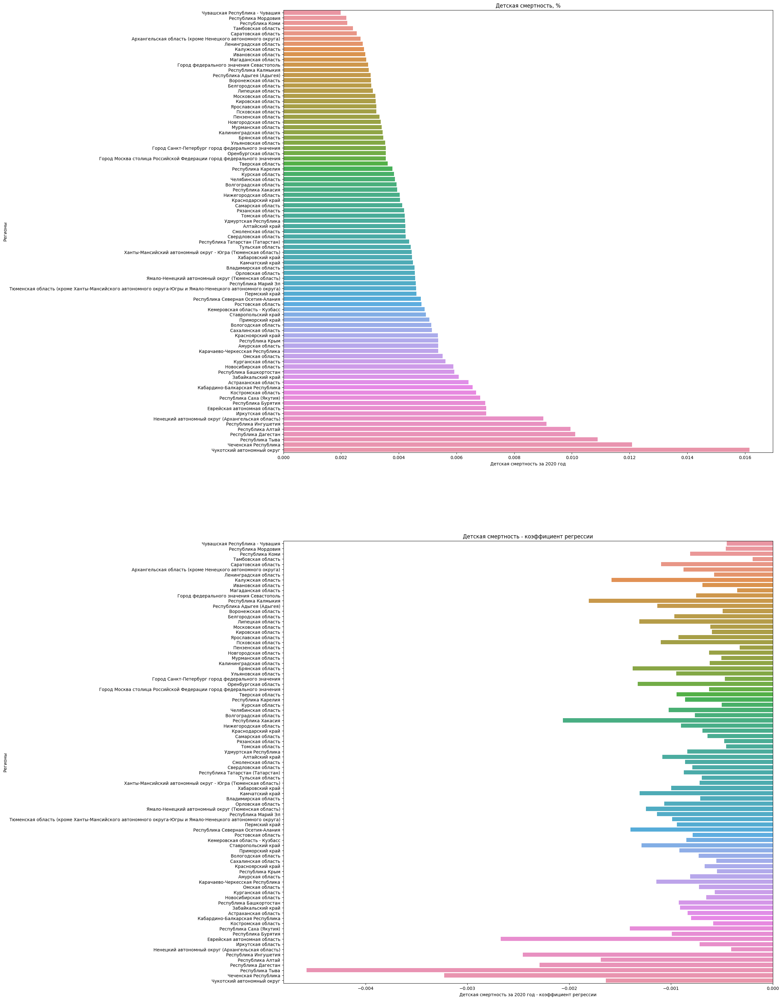

In [26]:
list_title = ['Детская смертность, %',
              'Детская смертность за 2020 год',
              'Регионы',
              'Детская смертность - коэффициент регрессии',
              'Детская смертность за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish(child_mortality_df)
visual_df(temp_df, list_title)
temp_df['2020'] = -temp_df['2020']
temp_df['k'] = -temp_df['k']

finish_df = temp_df.copy()


Из графиков можно сделать следующие выводы:  

* детская смертность отличается по регионам в несколько раз; выделяется семь регионов-лидеров данной статистики (Чукотский автономный округ, Чеченская Республика, Республика Тыва, Республика Дагестан, Республика Алтай, Республика Ингушетия, Ненецкий автономный округ (Архангельская область));
* во всех регионах присутствует тенденция к уменьшению детской смертности, причем в неблагополучных регионах она более заметна.

**Инвалидность**

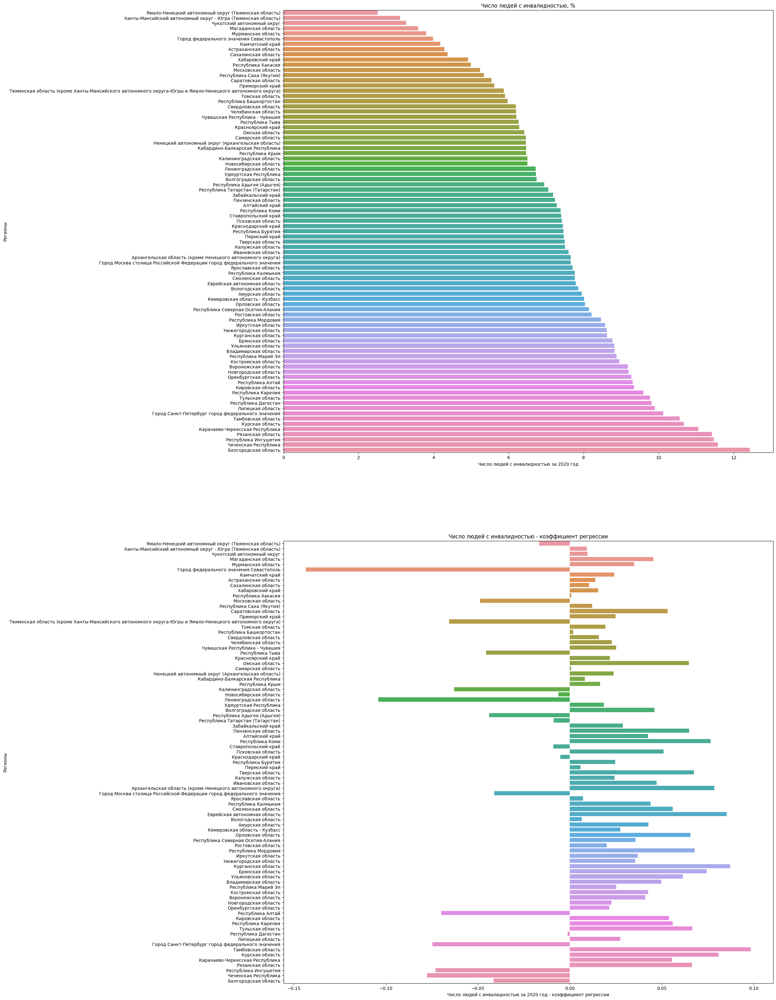

In [27]:
list_title = ['Число людей с инвалидностью, %',
              'Число людей с инвалидностью за 2020 год',
              'Регионы',
              'Число людей с инвалидностью - коэффициент регрессии',
              'Число людей с инвалидностью за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(disabled_total_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner', suffixes=('_child', '_disabled'))

visual_df(temp_df, list_title)

finish_df['2020_disabled'] = -finish_df['2020_disabled']
finish_df['k_disabled'] = -finish_df['k_disabled']



Как видно из графиков, количество инвалидов в регионах может отличаться друг от друга в несколько раз. Лидером по количеству инвалидов является Белгородская область. В некоторых регионах количестао инвалидов из года в год растет, а в других случаях падает.

**Заболеваемость населения**

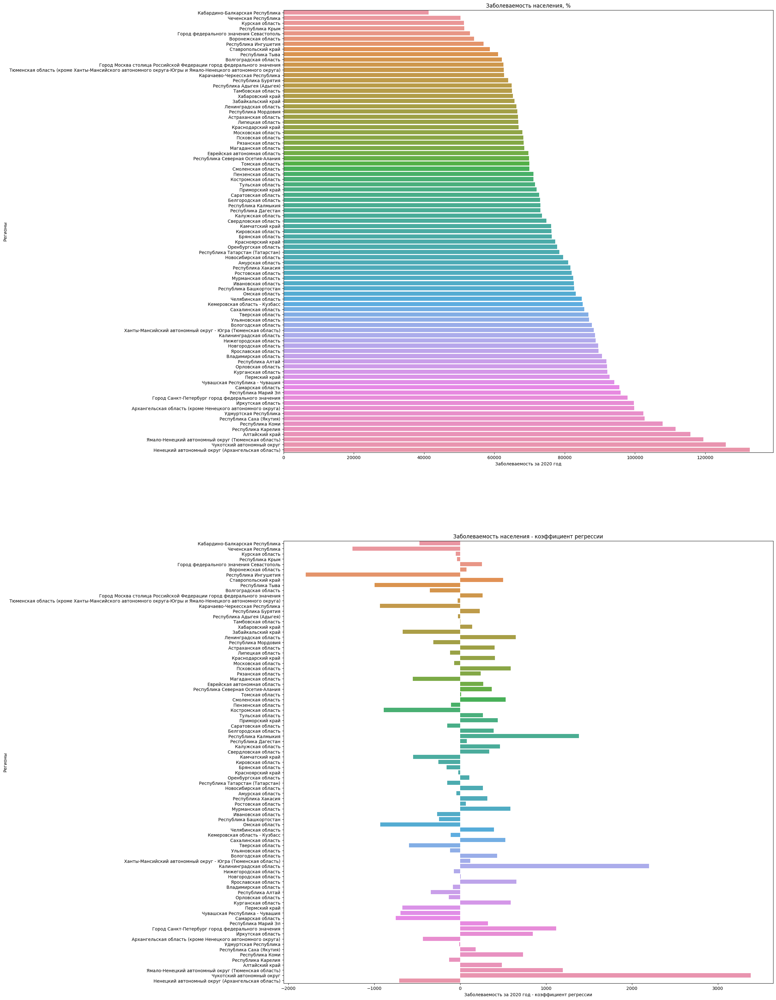

In [28]:
list_title = ['Заболеваемость населения, %',
              'Заболеваемость за 2020 год',
              'Регионы',
              'Заболеваемость населения - коэффициент регрессии',
              'Заболеваемость за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(morbidity_df,100000)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_morbidity', 'k': 'k_morbidity'}, inplace=True)

visual_df(temp_df, list_title)

Из графиков можно сделать следующие выводы: в ряде регионов наблюдается тенденция к снижению уровня заболевания, в части - к увеличению. Возможно, такие результаты можно объяснить тем, что рассматривалось общее количество заболеваний без учета возраста и тяжести.

**За чертой бедности**

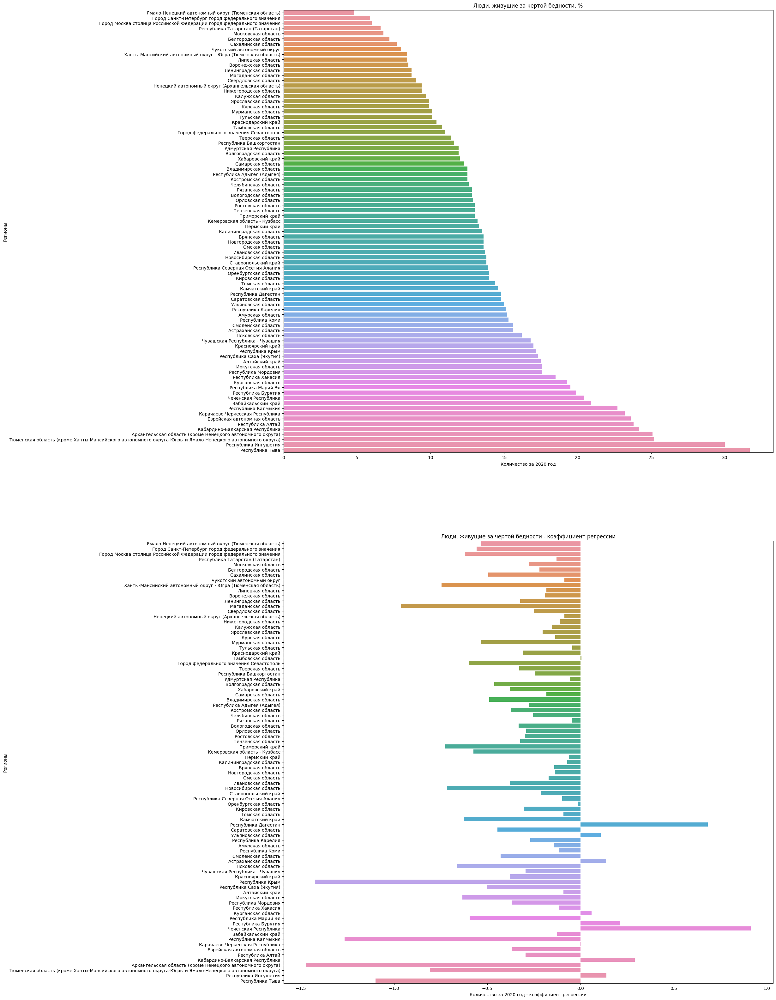

In [29]:
list_title = ['Люди, живущие за чертой бедности, %',
              'Количество за 2020 год',
              'Регионы',
              'Люди, живущие за чертой бедности - коэффициент регрессии',
              'Количество за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(poverty_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_poverty', 'k': 'k_poverty'}, inplace=True)

visual_df(temp_df, list_title)

Процент населения, живущего за чертой бедности - самая важная характеристика, которая определяет проблемные регионы. Можно заметить, что здесь есть группа регионов, которые испытывают проблемы. На общем фоне выделяются две республики - Тыва и Ингушетия. В Ингушетии процент малоимущего населения большой, и есть тенденция к его увеличению. Чеченская республика и Дагестан находятся не в самом низу таблицы, но имеют тенденцию к обнищанию населения. Все регионы, находящиеся выше Дагестана, имеют положительную тенденцию к снижению уровня бедности.

Коробчатая диаграмма позволит составить представление о ситуации с населением, живущим за чертой бедности в целом по стране.

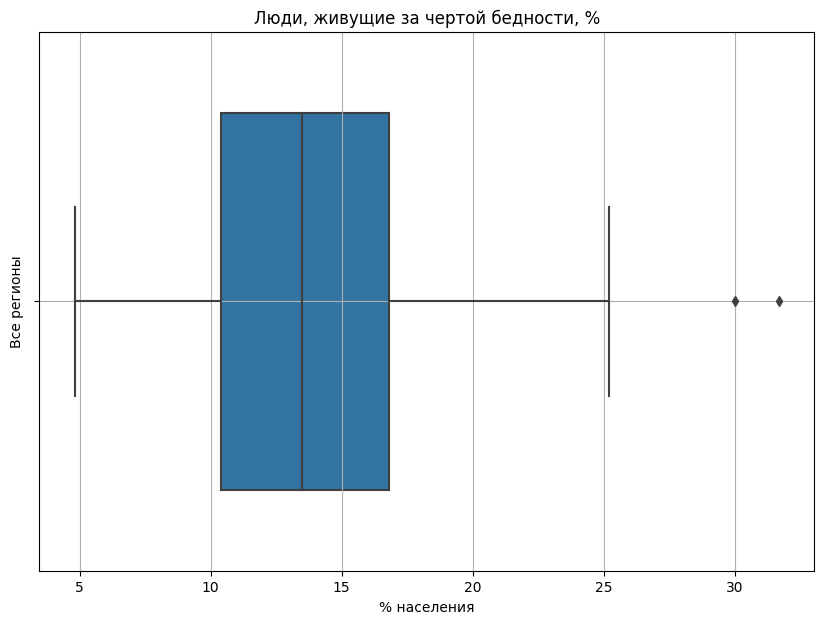

In [30]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Люди, живущие за чертой бедности, %');
boxplot.set_xlabel('% населения');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

На диаграмме отчётливо видны два региона (Тыва и Ингушетия). Их можно было бы расценить в качестве выбросов. Однако в данном случае это показатель соответствующего состояния дел в регионе. Левый ус отвечает за "богатые" регионы, а правый - за те, которые можно отнести к "бедным". Сама коробка должна включать в себя регионы, в которых уровень бедности можно признать допустимым.

**Расходы на социальную политику**

,okato,region,2020,k
0,14000000000,Белгородская область,16.1,0.834286
1,15000000000,Брянская область,23.1,-0.377143
2,17000000000,Владимирская область,26.0,1.574286
3,20000000000,Воронежская область,21.6,1.168571
4,24000000000,Ивановская область,25.1,0.625714
...,...,...,...,...
80,10000000000,Амурская область,21.7,-0.237143
81,44000000000,Магаданская область,11.1,0.314286
82,64000000000,Сахалинская область,16.5,1.705714
83,99000000000,Еврейская автономная область,31.2,2.500000


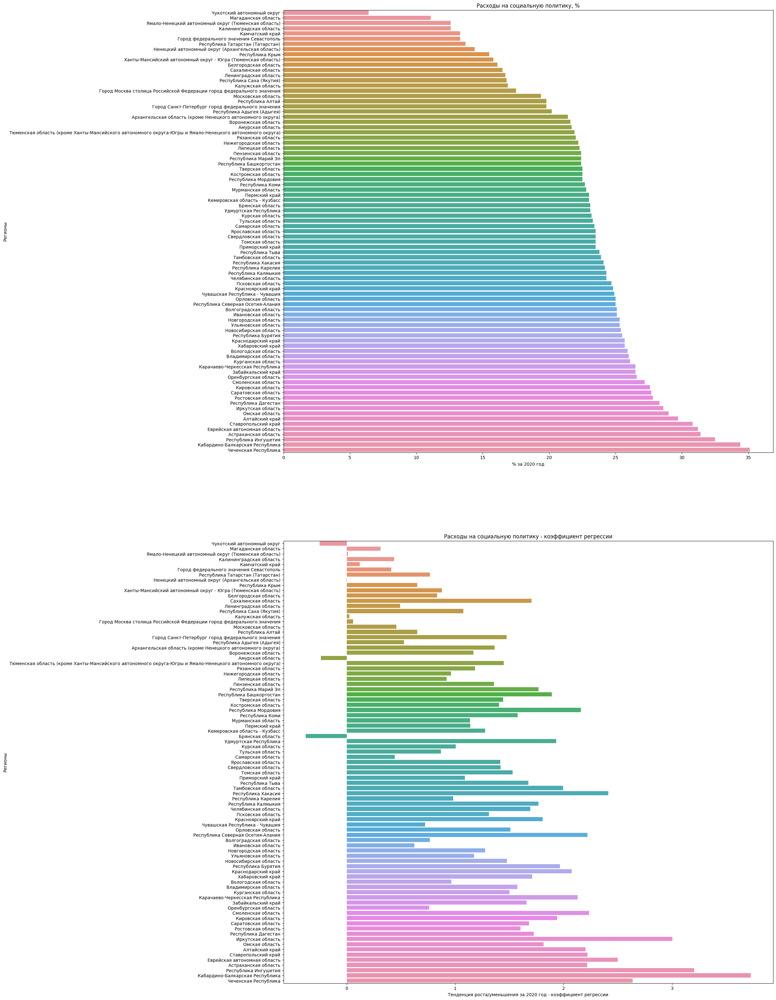

In [31]:
list_title = ['Расходы на социальную политику, %',
              '% за 2020 год',
              'Регионы',
              'Расходы на социальную политику - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(welfare_df,100)
display(temp_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_welfare', 'k': 'k_welfare'}, inplace=True)

visual_df(temp_df, list_title)



Из представленных диаграмм можно увидеть только явную тенденцию к увеличению расходов бюджета на социальную политику. В тех регионах, где расходы имеют тенденцию к уменьшению, нет проблем с малоимущим населением.

**Среднедушевые денежные доходы (в месяц)**

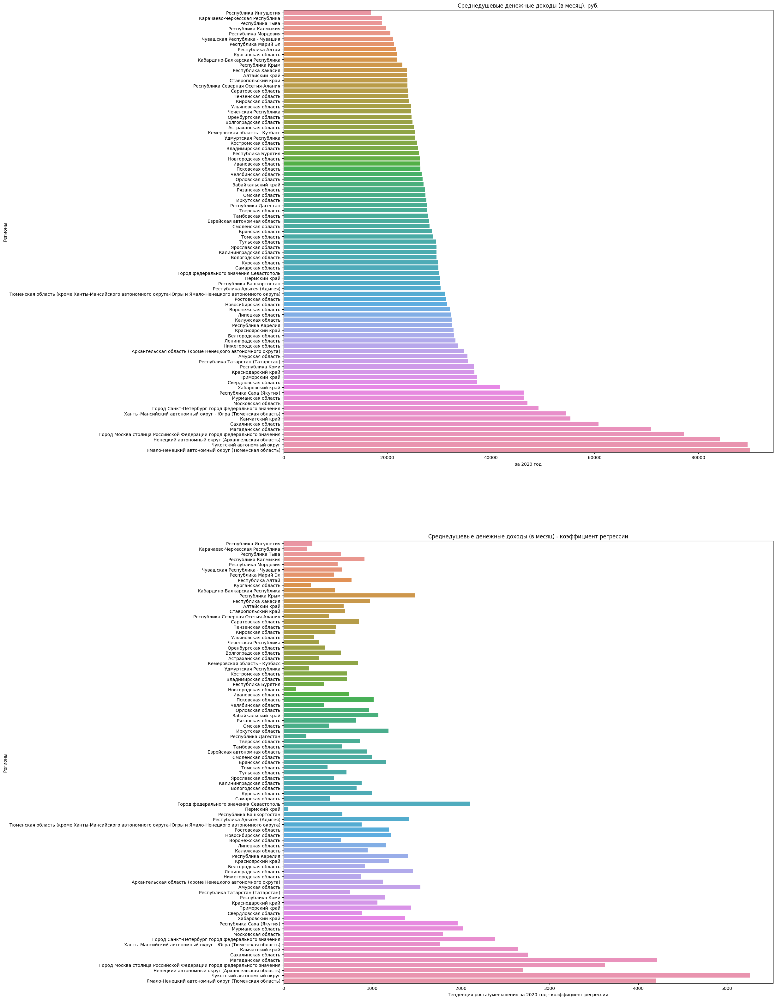

In [32]:
list_title = ['Среднедушевые денежные доходы (в месяц), руб.',
              'за 2020 год',
              'Регионы',
              'Среднедушевые денежные доходы (в месяц) - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']

cash_df = cash_formal_df[['okato', 'region', '2015', '2016', '2017', '2018', '2019', '2020']]
#cash_df.rename(columns={'2015_c': '2015', '2016_c': '2016', '2017_c': '2017', '2018_c': '2018', '2019_c': '2019', '2020_c': '2020'}, inplace=True)

temp_df = to_finish(cash_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_cash', 'k': 'k_cash'}, inplace=True)

visual_df(temp_df, list_title)


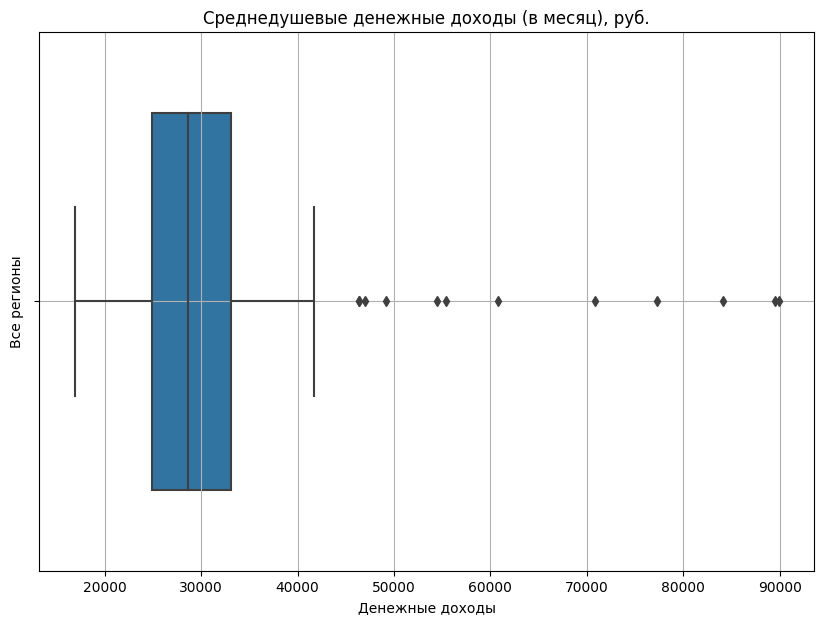

In [33]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Среднедушевые денежные доходы (в месяц), руб.');
boxplot.set_xlabel('Денежные доходы');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

На графиках наблюдается большое количество регионов, значение душевых доходов в которых лежит правее Q<sub>75</sub>. Из диаграммы можно сделать вывод, что среднедушевой доход в месяц находится где-то в районе 28 000 руб. Наиболее состоятельные регионы - Чукотский и Ямало-Ненецкий автономные округа.

**Валовый региональный продукт на душу населения**

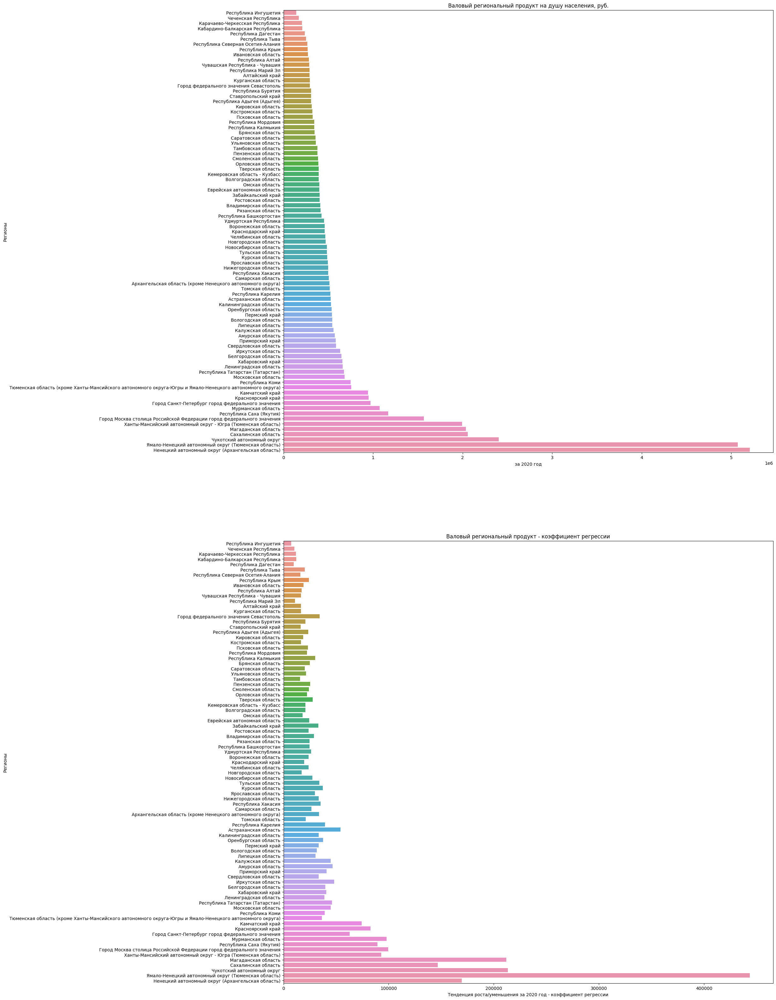

In [34]:
list_title = ['Валовый региональный продукт на душу населения, руб.',
              'за 2020 год',
              'Регионы',
              'Валовый региональный продукт - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']


temp_df = to_finish(regional_product_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_rp', 'k': 'k_rp'}, inplace=True)

visual_df(temp_df, list_title)



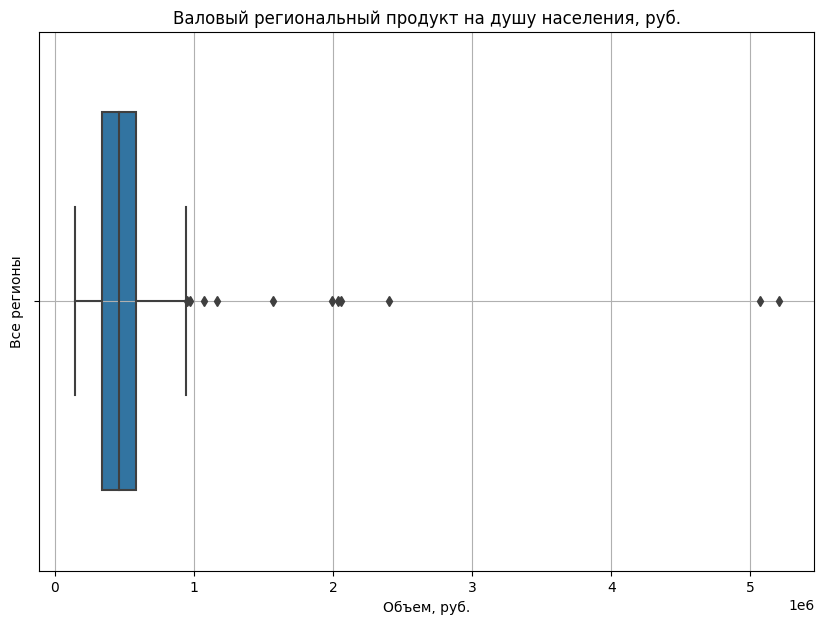

In [35]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Валовый региональный продукт на душу населения, руб.');
boxplot.set_xlabel('Объем, руб.');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

Вновь на графиках наблюдается ситуация, при которой есть несколько регионов-лидеров. 

**Объём отгруженных товаров собственного производства или работ/услуг, выполненных собственными силами**

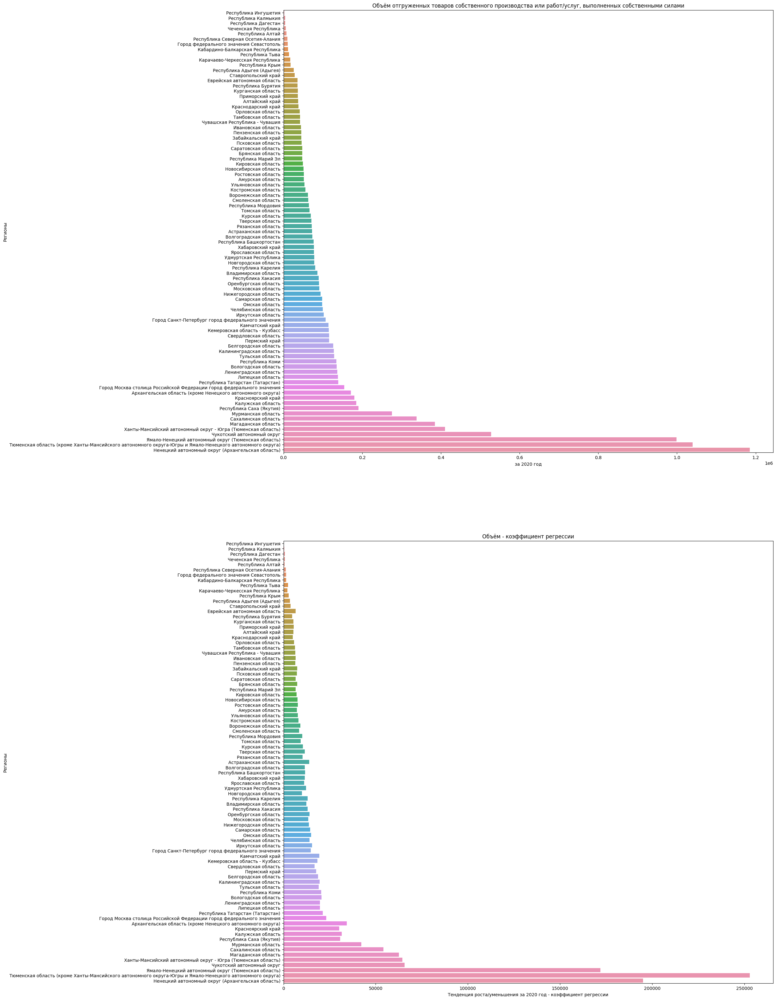

In [36]:
list_title = ['Объём отгруженных товаров собственного производства или работ/услуг, выполненных собственными силами',
              'за 2020 год',
              'Регионы',
              'Объём - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']


temp_df = to_finish(product_df)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_prod', 'k': 'k_prod'}, inplace=True)

visual_df(temp_df, list_title)


На графиках можем наблюдать регионы, в которых нет собственного производства. Они же, как правило, имеют большой процент бедного населения. Севастополь не относится к регионам с бедным населением, но объём товаров/услуг мал, что объясняется статусом города, как военно-морской базы Черноморского флота. В лидерах регионы, где ведётся активная дорбыча полезных ископаемых.

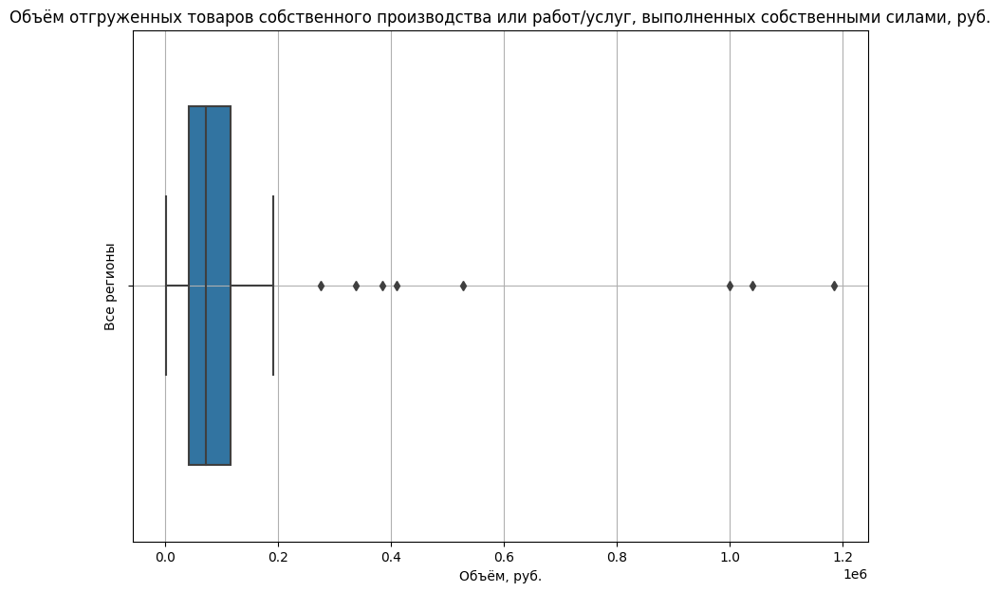

In [37]:
fig = plt.figure(figsize=(10, 7))
boxplot = sns.boxplot(
    data=temp_df,
#    y='country',
    x='2020',
    orient='h',
    width=0.7
)
boxplot.set_title('Объём отгруженных товаров собственного производства или работ/услуг, выполненных собственными силами, руб.');
boxplot.set_xlabel('Объём, руб.');
boxplot.set_ylabel('Все регионы');
boxplot.grid()

График подтверждает выводы предыдущего.

**Доля малоимущего населения младше трудоспособного возраста**

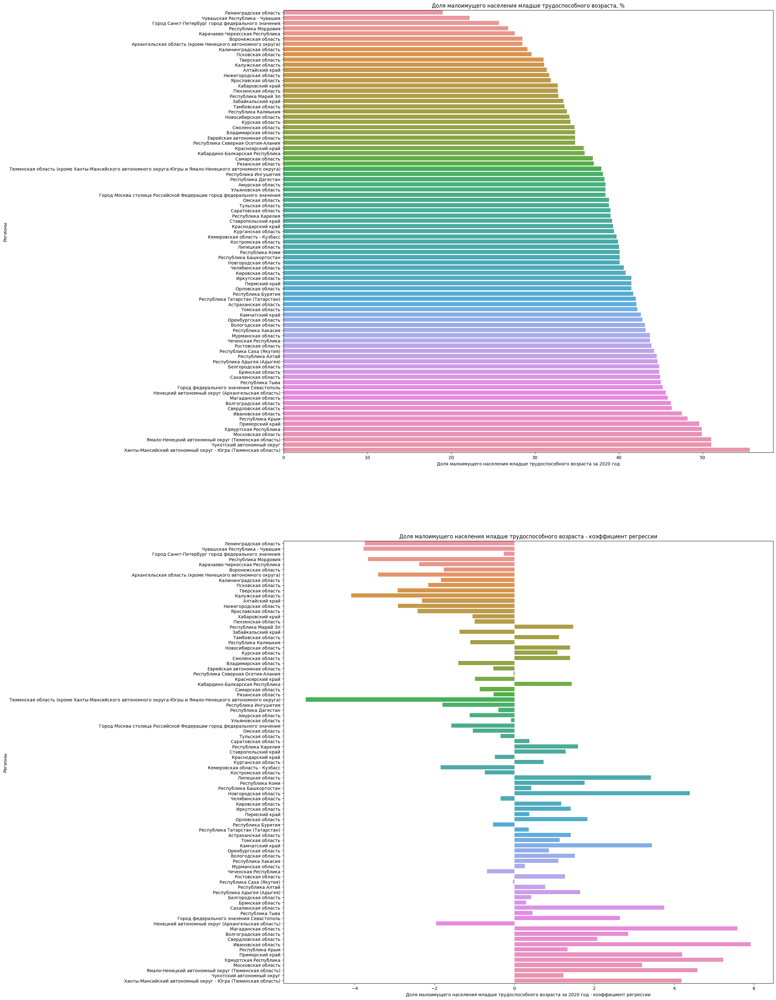

In [38]:
list_title = ['Доля малоимущего населения младше трудоспособного возраста, %',
              'Доля малоимущего населения младше трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля малоимущего населения младше трудоспособного возраста - коэффициент регрессии',
              'Доля малоимущего населения младше трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish2017(poverty_socdem_df,'child')

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_s_child', 'k': 'k_s_child'}, inplace=True)

visual_df(temp_df, list_title)


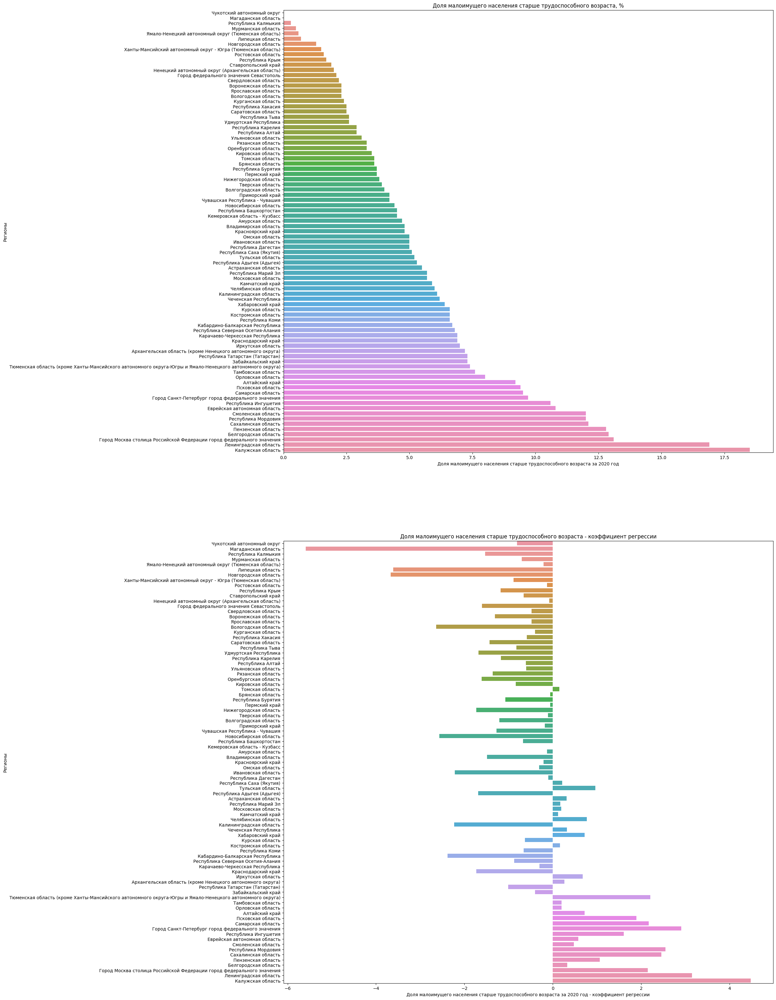

In [39]:
list_title = ['Доля малоимущего населения старше трудоспособного возраста, %',
              'Доля малоимущего населения старше трудоспособного возраста за 2020 год',
              'Регионы',
              'Доля малоимущего населения старше трудоспособного возраста - коэффициент регрессии',
              'Доля малоимущего населения старше трудоспособного возраста за 2020 год - коэффициент регрессии',
              'Регионы']
temp_df = to_finish2017(poverty_socdem_df,'retiree')

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_s_retiree', 'k': 'k_s_retiree'}, inplace=True)

visual_df(temp_df, list_title)

Можно сказать, что количество людей старшего возраста превышает количество молодых, т.е. население стареет, особенно выделяются Калужская область и Ленинградская область.

**Оборот розничной торговли на душу населения**

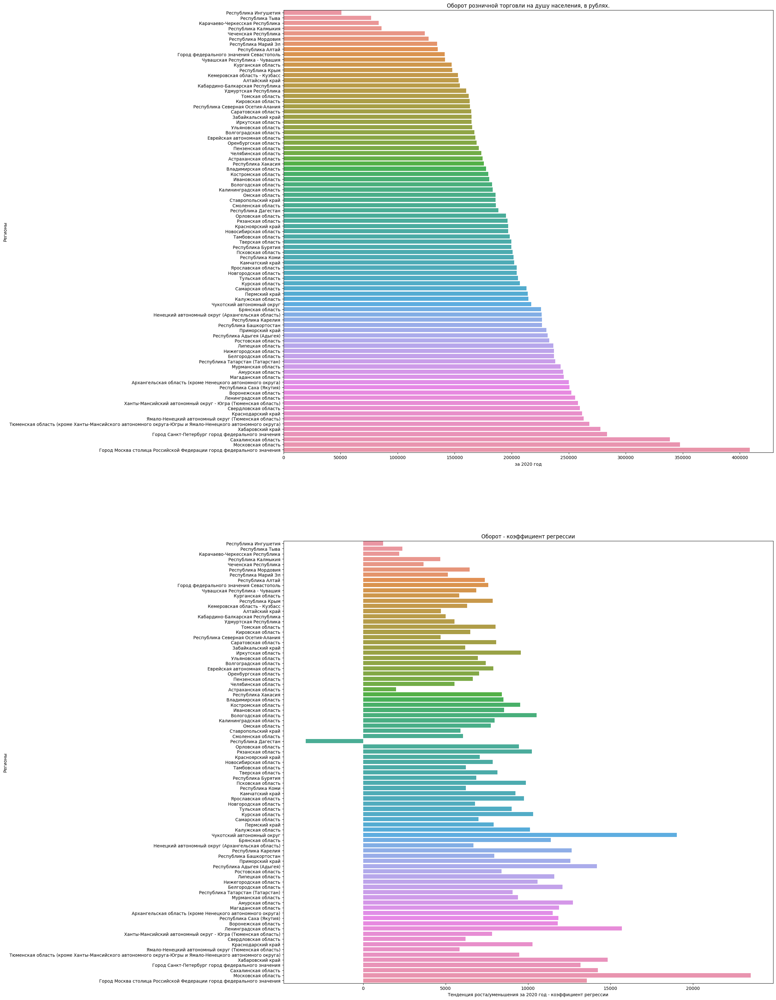

In [40]:
list_title = ['Оборот розничной торговли на душу населения, в рублях.',
              'за 2020 год',
              'Регионы',
              'Оборот - коэффициент регрессии',
              'Тенденция роста/уменьшения за 2020 год - коэффициент регрессии',
              'Регионы']


temp_df = to_finish(retail_df,100)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')

finish_df.rename(columns={'2020': '2020_retail', 'k': 'k_retail'}, inplace=True)

visual_df(temp_df, list_title)


Тыва, Ингушетия, Карачаево-Черкесская республики имеют худшие показатели, а Москва - лучшие.

**Заболеваемость с впервые в жизни установленным диагнозом алкоголизма и алкогольного психоза**

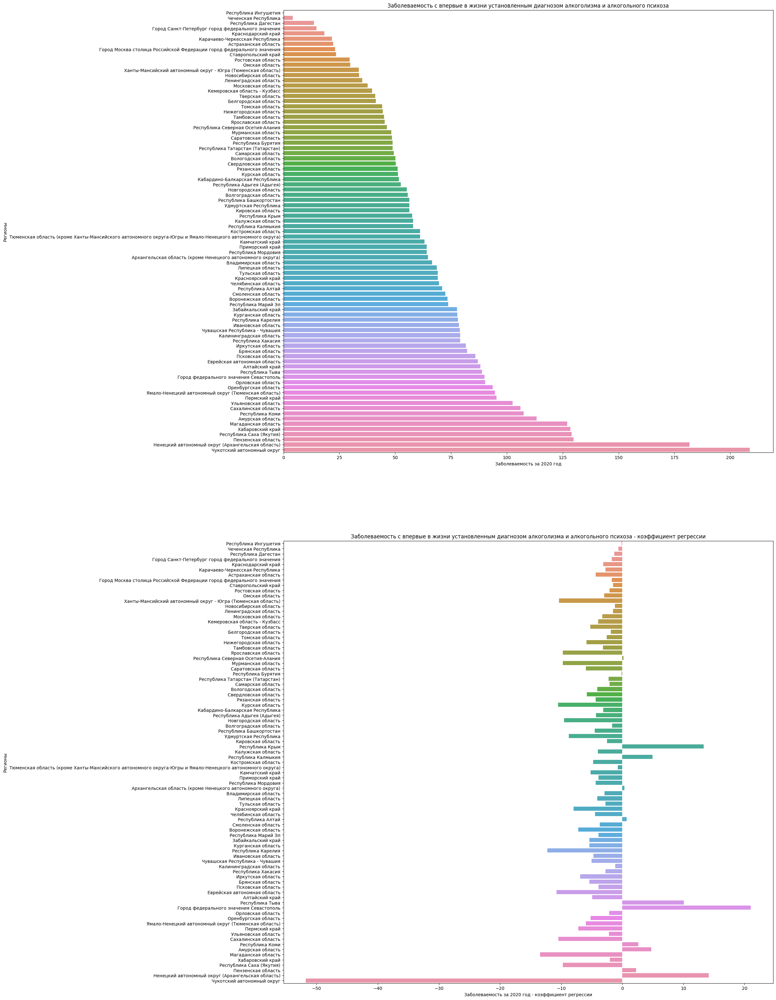

In [41]:
list_title = ['Заболеваемость с впервые в жизни установленным диагнозом алкоголизма и алкогольного психоза',
              'Заболеваемость за 2020 год',
              'Регионы',
              'Заболеваемость с впервые в жизни установленным диагнозом алкоголизма и алкогольного психоза - коэффициент регрессии',
              'Заболеваемость за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(alco_df,1000)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_alco', 'k': 'k_alco'}, inplace=True)

visual_df(temp_df, list_title)
finish_df.to_excel('out/finish_top.xlsx') # stop 20231029

Лидеры - Ненецкий и Чукотский автономные округа.

**Заболеваемость с впервые в жизни установленным диагнозом наркомании**

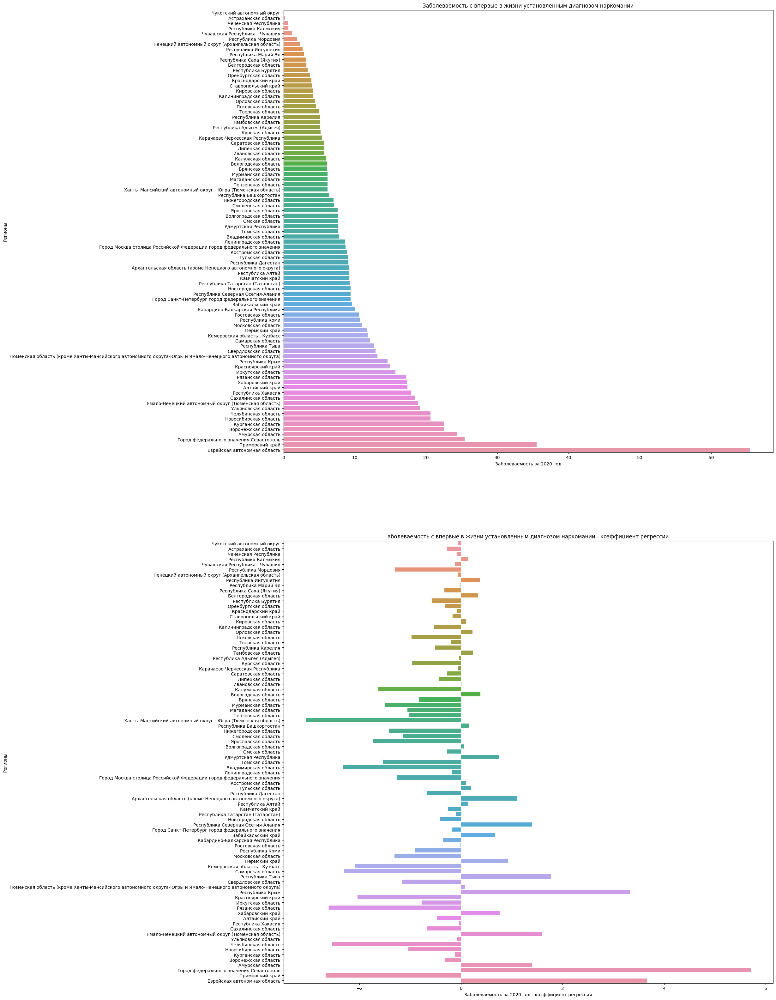

In [42]:
list_title = ['Заболеваемость с впервые в жизни установленным диагнозом наркомании',
              'Заболеваемость за 2020 год',
              'Регионы',
              'аболеваемость с впервые в жизни установленным диагнозом наркомании - коэффициент регрессии',
              'Заболеваемость за 2020 год - коэффициент регрессии',
              'Регионы']

temp_df = to_finish(drug_df,1000)

finish_df = finish_df.merge(temp_df.drop(columns='region'), on='okato', how='inner')
finish_df['2020'] = -finish_df['2020']
finish_df['k'] = -finish_df['k']
finish_df.rename(columns={'2020': '2020_drug', 'k': 'k_drug'}, inplace=True)

visual_df(temp_df, list_title)

Можно сделать вывод, что алкоголизм и наркомания скорее связана с региональными/национальными особенностями, и не показывают какой-то прямой связи с уровнем жизни населения.

### 3. Построение модели

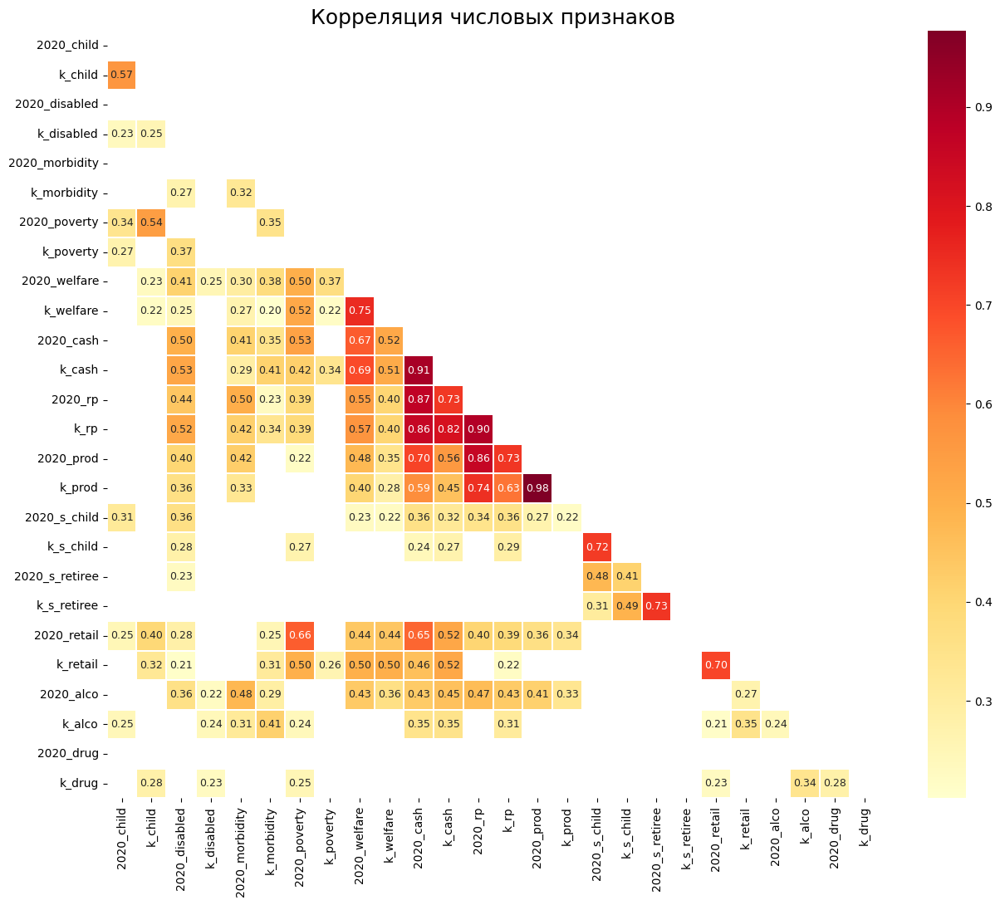

In [43]:
def chart_correlation_heatmap(df, 
                              columns, 
                              title, 
                              method='pearson', 
                              correlation_threshold=.6):
    """Построение корреляционной диаграммы"""
    fig_, ax_ = plt.subplots(figsize=(15, 12))
    correlation_matrix = df[columns].corr(method=method).abs()
    mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
    sns.heatmap(correlation_matrix[correlation_matrix.abs() > correlation_threshold], 
                annot=True,
                annot_kws={"fontsize":9}, 
                linewidths=0.1, 
                ax=ax_, 
                mask=mask, 
                cmap='YlOrRd',
                fmt='.2f')
    ax_.set_title(title, fontsize=18)
    plt.show()

df = finish_df.select_dtypes(include=np.number)
numerical_columns = df.columns

chart_correlation_heatmap(df, 
                          numerical_columns, 
                          'Корреляция числовых признаков',
                          correlation_threshold = .2)

In [44]:
df1 = df.copy()

In [45]:
scaler = preprocessing.MinMaxScaler(feature_range=(-1, 1))
scaler.fit(df)
rfm_table_scaled = scaler.transform(df)

tsne = TSNE(n_components=2, perplexity=50, random_state=42)

rfm_table_processed = pd.DataFrame(data = tsne.fit_transform(rfm_table_scaled), columns=['axis-1','axis-2'])
display(round(tsne.kl_divergence_,2))

0.13

<AxesSubplot: xlabel='axis-1', ylabel='axis-2'>

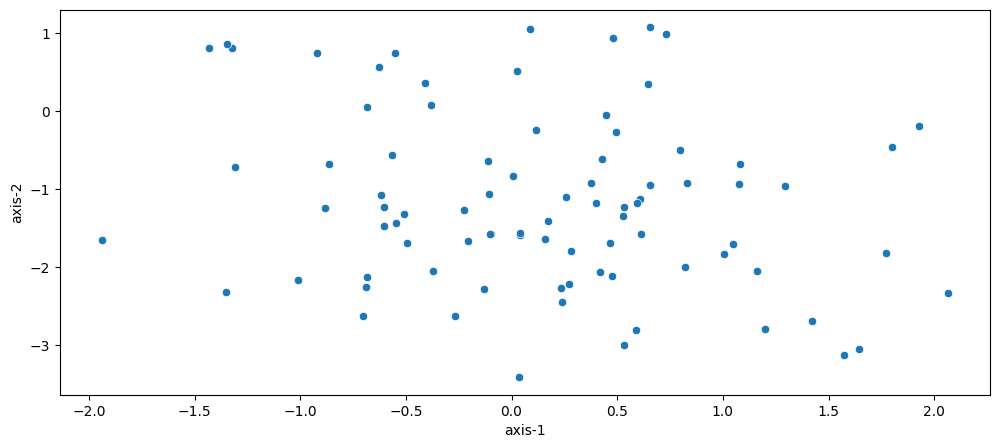

In [46]:
fig = plt.figure(figsize=(12, 5))
sns.scatterplot(data=rfm_table_processed, x='axis-1', y='axis-2')

Для нахождения оптимального количества кластеров используем метод силуэта. 
Применим его последовательно к алгоритмам k-means, Gaussian Mixture Model и агломеративном.

#### K-Means

Метод локтя

<AxesSubplot: xlabel='cluster', ylabel='inertia'>

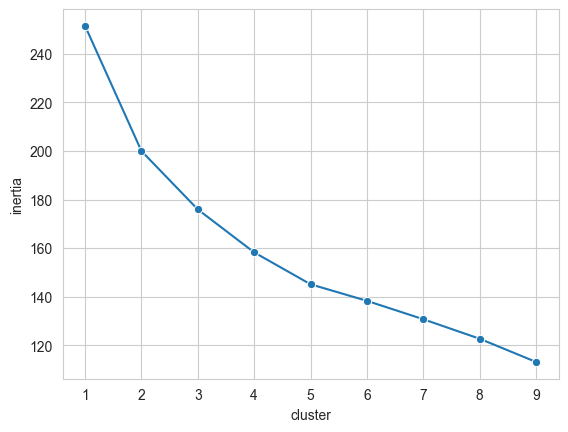

In [47]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_inertia(cluster_num, X):
    k_means =  KMeans(n_clusters=cluster_num, random_state=42)
    k_means.fit(X_norm)
    inertia = k_means.inertia_
    return inertia

res = {"inertia": [], "cluster": []}


for cluster_num in range(1, 10):
    res["inertia"].append(get_inertia(cluster_num, X_norm))
    res["cluster"].append(cluster_num)

res_df = pd.DataFrame(res)

sns.set_style("whitegrid")
sns.lineplot(data=res_df, x="cluster", y="inertia", marker= "o")

Из получившегося графика довольно трудно определить количество кластеров. Ближе к 4, возможно.

0.35616763956321307

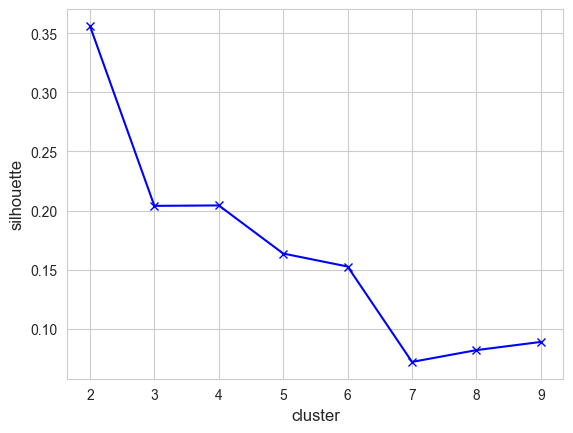

In [48]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouette(cluster_num, X):
    k_means =  KMeans(n_clusters=cluster_num, random_state=42)
    k_means.fit(X)
    silhouette = silhouette_score(X, k_means.labels_, metric='euclidean')
    return silhouette

silhouettes = []
for i in range(2, 10):
    silhouettes.append(get_silhouette(i, X_norm))

display(max(silhouettes))
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

Из получившегося графика довольно сложно определить количество кластеров. Также, возможное количество - 4.

GMM

0.36

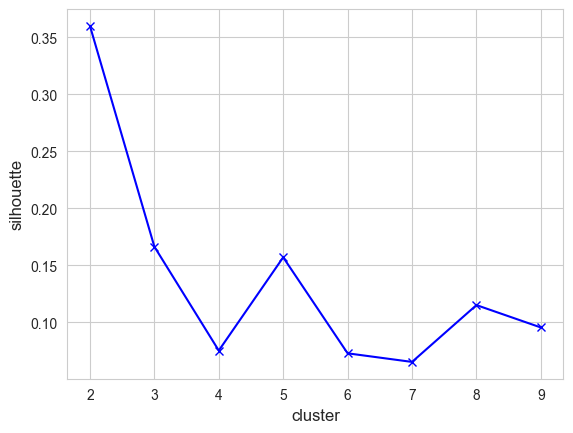

In [49]:
gmm_df = df1.copy()
X = gmm_df.values
scaler = StandardScaler()
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouetteG(cluster_num, X):
    gm = GaussianMixture(n_components=cluster_num, random_state=42)
    gm.fit(X)
    silhouette = silhouette_score(X, gm.predict(X), metric='euclidean')
    return silhouette

silhouettes = []
for i in range(2, 10):
    silhouettes.append(get_silhouetteG(i, X_norm))
    
display(round(max(silhouettes),2))
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

Согласно результату получившегося графика, количество кластеров - 5.

AgglomerativeClustering

0.5403194108492881

2

0.2583926124384499

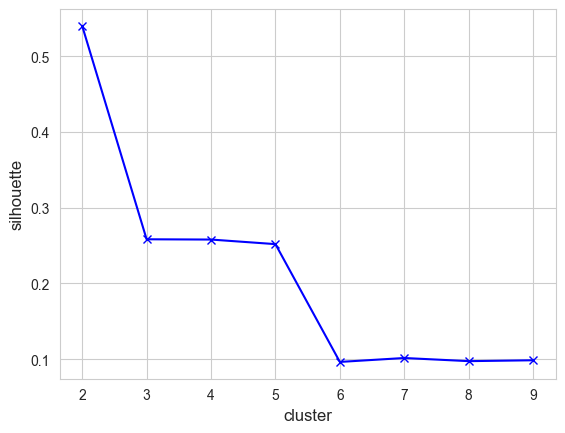

In [50]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouette_AC(cluster_num, X):
    k_AC =  AgglomerativeClustering(n_clusters=cluster_num)
    k_AC.fit(X)
    silhouette = silhouette_score(X, k_AC.labels_, metric='euclidean')
    return silhouette

silhouettes = []
min_silhouette = 0
min_samples_obr = 0
for i in range(2, 10):
    s = get_silhouette_AC(i, X_norm)
    silhouettes.append(s)
    if i == 3:
        m3_sh = s
    if s > min_silhouette:
            min_silhouette = s
            min_samples_obr = i
display(min_silhouette)
display(min_samples_obr)
display(m3_sh)
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

Из трёх алгоритмов наилучший показатель у агломеративной иерархической кластеризации. Количество рекомендованных данным алгоритмом кластеров &mdash; 5. Это несколько больше, чем хочется, т.к. на первый взгляд оптимальное количество кластеров &mdash; 4 (малоимущие, бедные, среднего класса и богатые регионы).

Два других алгоритма предлагают количество кластеров, равное четырём и пяти.


Построим модель на основе агломеративной иерархической кластеризации с количеством кластеров, равным 5.

In [51]:
cluster_num = 5
k_AC =  AgglomerativeClustering(n_clusters=cluster_num, linkage='ward')

cluster_AC = k_AC.fit_predict(X_norm)
df.loc[:, 'label_ac'] = cluster_AC
display(df['label_ac'].value_counts())
f_df = finish_df.merge(df, left_index=False, right_index=False)
f_df.to_excel('out/finish_ac3.xlsx')
print(silhouette_score(X_norm, cluster_AC))


0    64
4     9
2     5
3     4
1     3
Name: label_ac, dtype: int64

0.2519910892194411


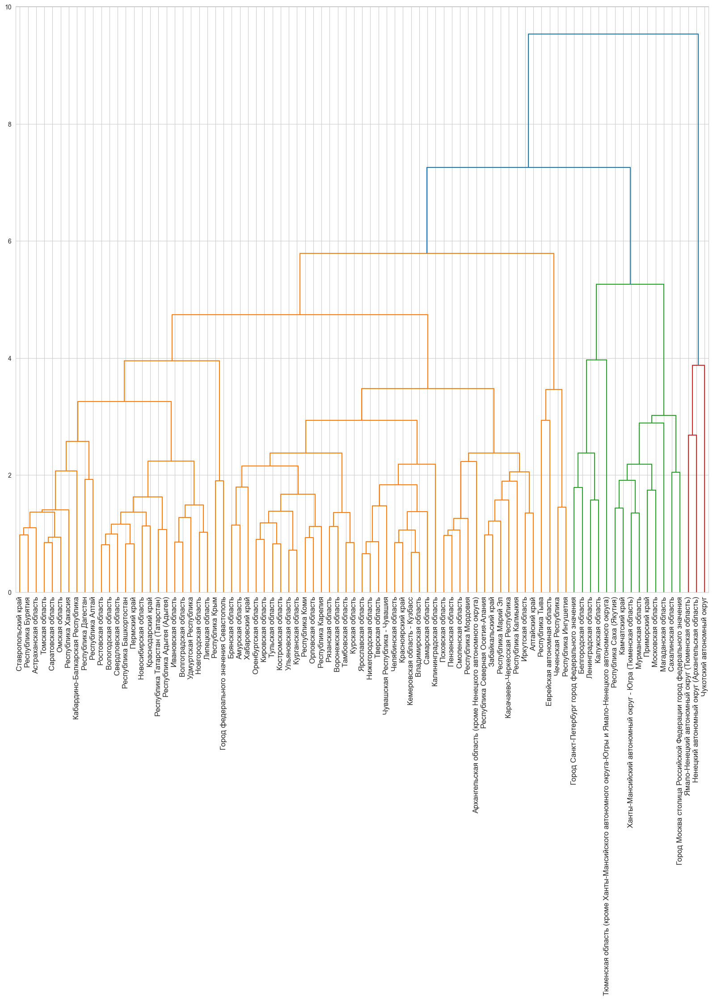

In [58]:
from scipy.cluster.hierarchy import dendrogram, linkage
linked = linkage(X_norm, 'ward')

plt.figure(figsize=(20, 17))

# дендрограмма с ориентацией top
# сначала будут отрисовываться кластеры с минимальным расстоянием между друг другом
dendrogram(Z=linked,
            orientation='top',
            labels=f_df['region'].to_list(),
            distance_sort='descending',
            leaf_rotation=90, leaf_font_size=12)

plt.show()

Получившиеся бедными регионы соответствуют этому статусу, но их очень мало. Попробуем еще два варианта: спектральная кластеризация и ансамблевый метод.

SpectralClustering

0.5271354090052698

3

0.5271354090052698

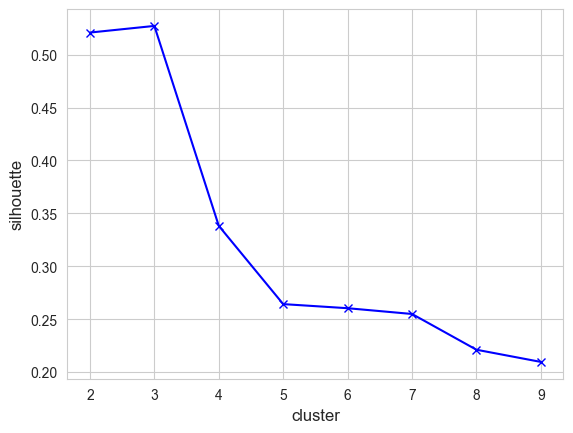

In [59]:
from sklearn.cluster import SpectralClustering

df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)

def get_silhouette_SC(cluster_num, X):
    k_SC =  SpectralClustering(n_clusters=cluster_num)
    k_SC.fit(X)
    silhouette = silhouette_score(X, k_SC.labels_, metric='euclidean')
    return silhouette

silhouettes = []
min_silhouette = 0
min_samples_obr = 0
for i in range(2, 10):
    s = get_silhouette_SC(i, X_norm)
    silhouettes.append(s)
    if i == 3:
        m3_sh = s
    if s > min_silhouette:
            min_silhouette = s
            min_samples_obr = i
display(min_silhouette)
display(min_samples_obr)
display(m3_sh)
plt.xlabel("cluster", fontsize=12)
plt.ylabel("silhouette", fontsize=12)
plt.plot([i for i in range(2, 10)], silhouettes, 'xb-')

Метод силуэта дает оптимальным вариант с тремя кластерами.

Попробуем реализовать с 4 кластерами, так как в большинстве случаев фигурирует это число кластеров.

In [60]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)
sp_clustering = SpectralClustering(n_clusters = 4, affinity ='nearest_neighbors', random_state=42, assign_labels='cluster_qr',n_neighbors=10)
sp_clustering.fit(X_norm)

df['cluster'] = sp_clustering.labels_
display(df['cluster'].value_counts())

best_df = finish_df.merge(df, left_index=False, right_index=False)
display(best_df['cluster'].value_counts())
best_df.to_excel('out/finish_sp.xlsx')

3    33
2    19
1    19
0    14
Name: cluster, dtype: int64

3    33
2    19
1    19
0    14
Name: cluster, dtype: int64

In [ ]:
df = df1.copy()
X = df.values
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(X)
X_norm = scaler.transform(X)
n_cluster = 4

kmeans = KMeans(n_clusters=n_cluster, random_state=42)
agglo = AgglomerativeClustering(n_clusters=n_cluster)
gmm = GaussianMixture(n_components=n_cluster, random_state=42)
spc = SpectralClustering(n_clusters=n_cluster, random_state=42)

kmeans_clusters = kmeans.fit_predict(X_norm)
agglo_clusters = agglo.fit_predict(X_norm)
gmm_clusters = gmm.fit_predict(X_norm)
spc_clusters = spc.fit_predict(X_norm)

def majority_voting(clusters):
    final_clusters = []
    for i in range(len(clusters[0])):
        votes = {}
        for cluster in clusters:
            if cluster[i] not in votes:
                votes[cluster[i]] = 1
            else:
                votes[cluster[i]] += 1
        final_clusters.append(max(votes, key=votes.get))
    return final_clusters
 
clusters = [kmeans_clusters, agglo_clusters, gmm_clusters, spc_clusters]
 
final_clusters = majority_voting(clusters)
 
print(silhouette_score(X_norm, final_clusters))

display(final_clusters)
#f_c = pd.DataFrame(data = final_clusters, columns=['cluster'])
#f_df = finish_df.merge(f_c, left_index=False, right_index=False)
#f_df['cluster'] = final_clusters
display(f_df.info())
display(f_df['cluster'].value_counts())

f_df.to_excel('out/finish_ans.xlsx')

Использование ансамблевого метода не принесло хорошего результата.

In [63]:
#регионы, которые были отнесены к наиболее нуждающимся в помощи.
display(best_df[best_df['cluster'] == 1]['region'])

3                  Астраханская область
13         Еврейская автономная область
14                   Забайкальский край
17      Кабардино-Балкарская Республика
21      Карачаево-Черкесская Республика
38                       Омская область
46                     Республика Алтай
48                   Республика Бурятия
49                  Республика Дагестан
50                 Республика Ингушетия
51                  Республика Калмыкия
55                  Республика Марий Эл
58    Республика Северная Осетия-Алания
60                      Республика Тыва
61                   Республика Хакасия
65                  Саратовская область
69                  Ставропольский край
72                      Томская область
80                 Чеченская Республика
Name: region, dtype: object

Будем строить выводы, исходя из лучших результатов работы алгоритмов, выберем оптимальное количествво кластеров - 4, что логически вытекает из проведённых исследований.

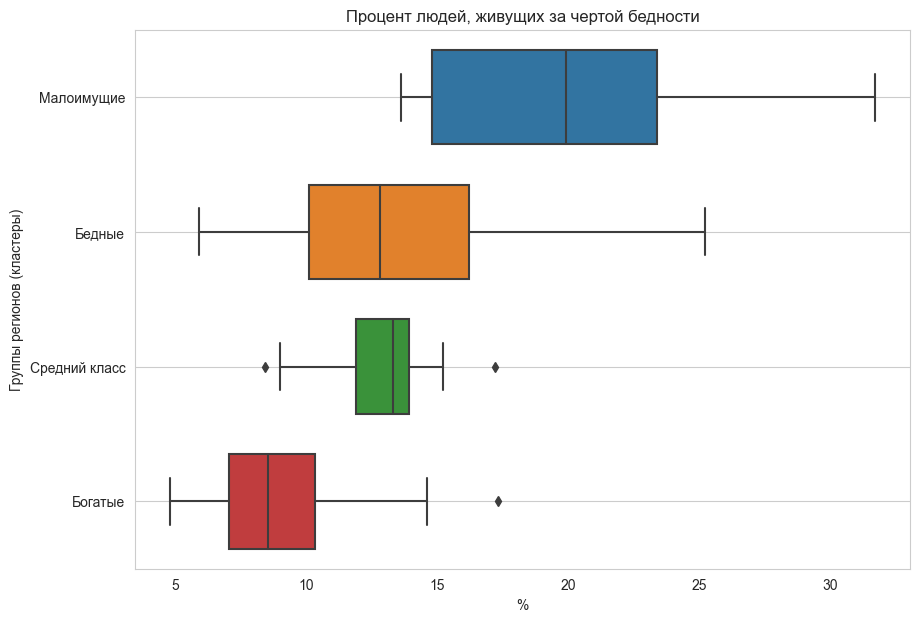

In [64]:
cluster_label = ['Малоимущие', 'Бедные', 'Средний класс', 'Богатые']
best_df['cluster'] = best_df['cluster'].apply(lambda x: x if x == 1 else 4 if x == 0 else 3 if x == 2 else 2)
best_tmp = best_df.copy()

best_tmp['2020_poverty'] = - best_tmp['2020_poverty']
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_poverty',
    orient='h',
    width=0.7
)
b.set_title('Процент людей, живущих за чертой бедности');
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

Рассмотрим экономические показатели регионов.

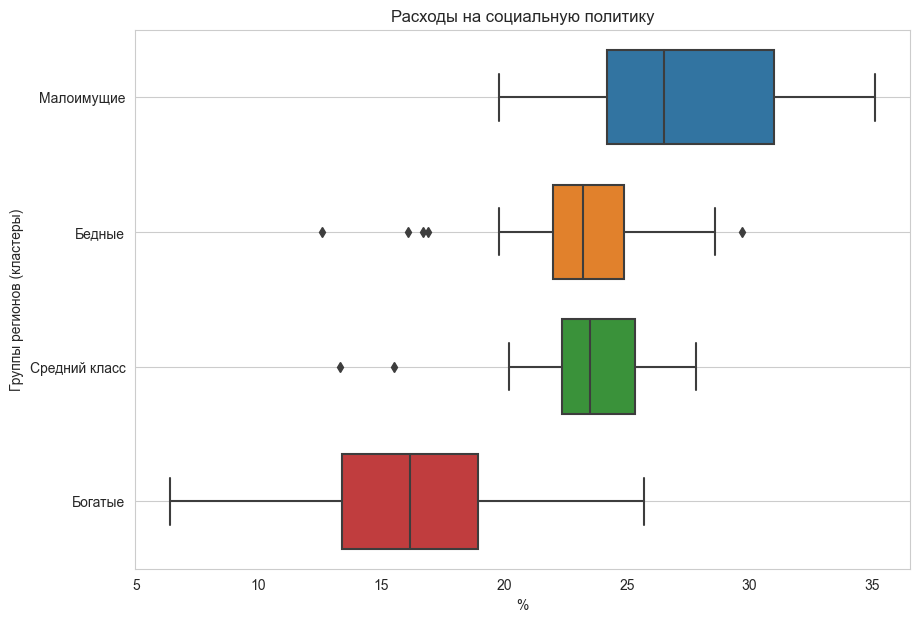

In [65]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_welfare',
    orient='h',
    width=0.7
)
b.set_title('Расходы на социальную политику')
b.set_xlabel('%')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

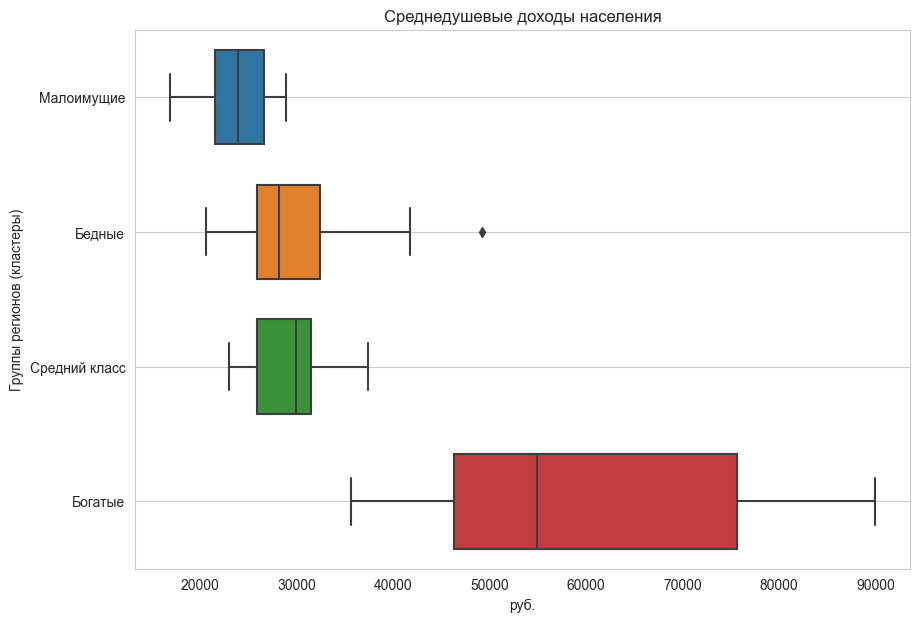

In [66]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_cash',
    orient='h',
    width=0.7
)
b.set_title('Среднедушевые доходы населения')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

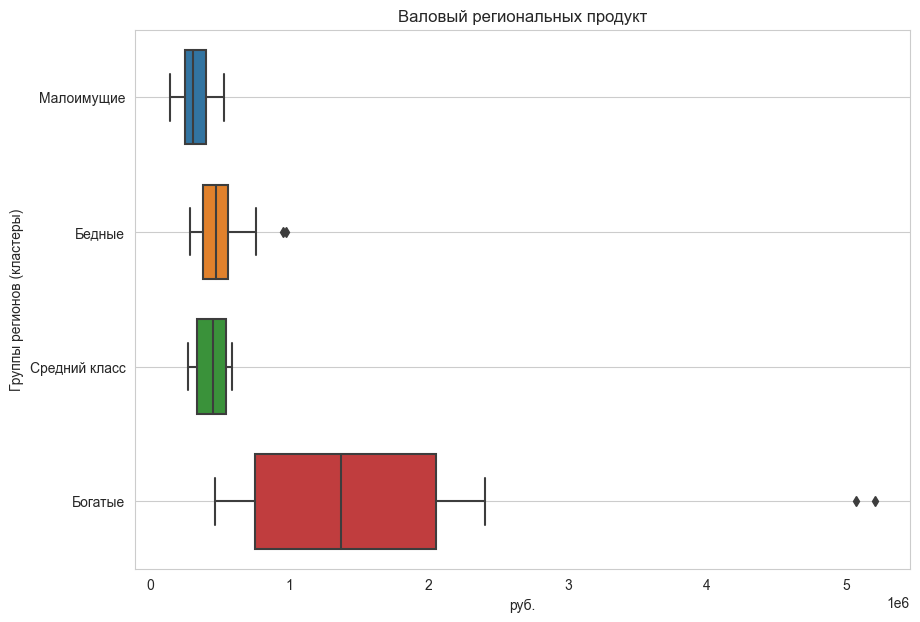

In [67]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_rp',
    orient='h',
    width=0.7
)
b.set_title('Валовый региональных продукт')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

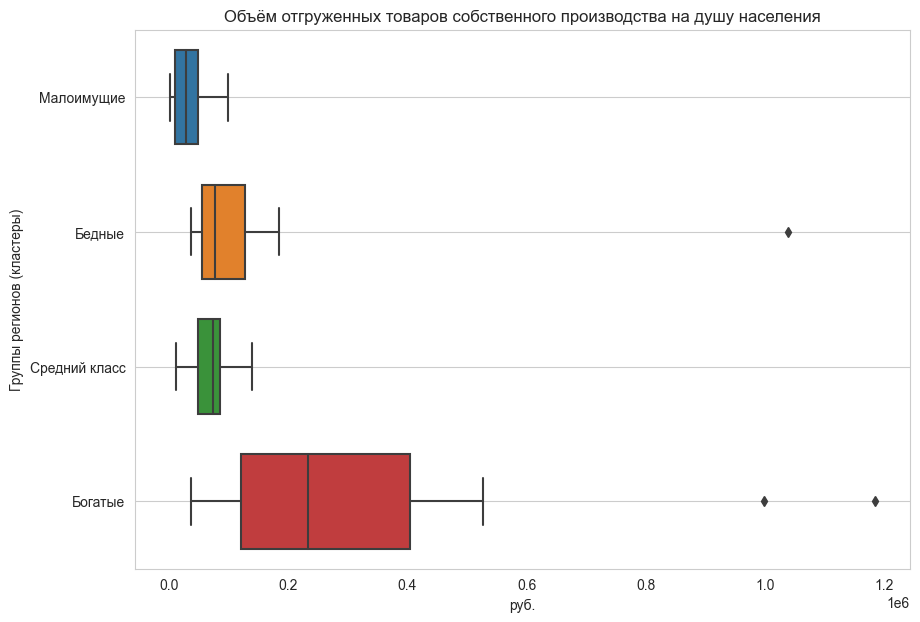

In [68]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_prod',
    orient='h',
    width=0.7
)
b.set_title('Объём отгруженных товаров собственного производства на душу населения')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

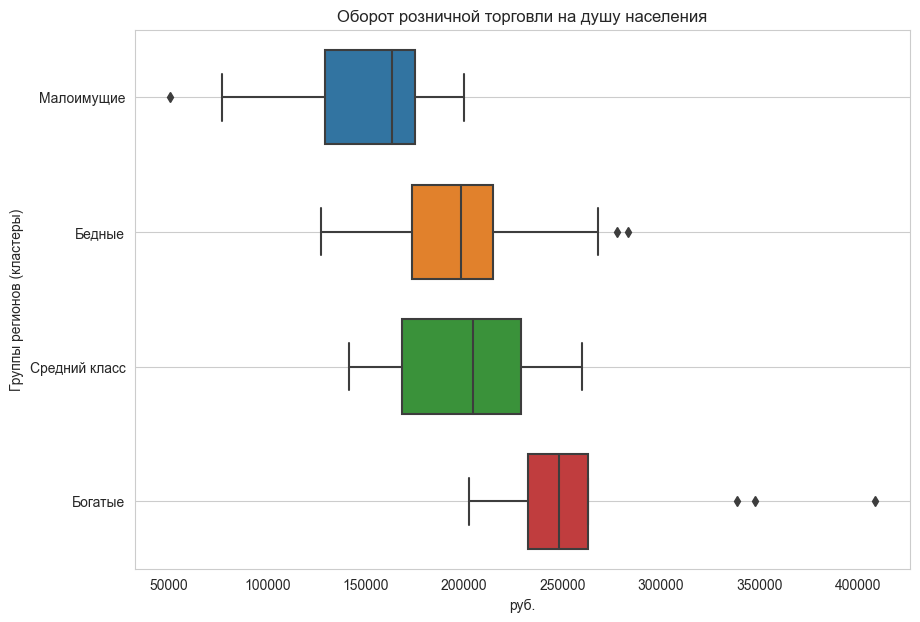

In [69]:
fig = plt.figure(figsize=(10, 7))
b=boxplot = sns.boxplot(
    data=best_tmp,
    y='cluster',
    x='2020_retail',
    orient='h',
    width=0.7
)
b.set_title('Оборот розничной торговли на душу населения')
b.set_xlabel('руб.')
b.set_ylabel('Группы регионов (кластеры)')
b.set_yticklabels(cluster_label)
b.grid()

### 4. Выводы

* характерной чертой малоимущих и бедных регионов является низкий уровень экономического развития: низкий объём валового продукта, меньший чем в других регионах объём отгруженных товаров собственного производства на душу населения и оборот розничной торговли;  

* в малоимущих и бедных регионах самый маленький процент занятых в экономике и большой процент малоимущих;  

* в малоимущих и бедных регионах самый большой процент младенческой смертности, при этом самый большой процент молодого населения;  

* в малоимущих и бедных регионах ниже общий уровень заболеваемости, что, скорее всего, связано с низким уровнем развития здравоохранения;  

* в малоимущих и бедных регионах самый большой процент от регионального бюджета идёт на поддержку малоимущего населения.

Таким образом:

* Число детей, пенсионеров и других социально уязвимых групп населения влияет на уровень бедности в регионе, так как эти слои не заняты в экономике.  

* Уровень бедности/социального неблагополучия связан с производством и потреблением в регионе прямым образом, так как в регионах с собственным производством наблюдаются бОльшие доходы населения. Более того, регионы, в которых нет собственного производства имеют большой процент бедного населения.  

* Также можно наблюдать отстутствие зависимости наличия диагнозов алкоголизма и наркомании с уровнем жизни населения.

* В тех регионах, где расходы бюджета на социальную политику имеют тенденцию к уменьшению, нет проблем с малоимущим населением.